In [1]:
import sys
import time
%pylab inline
%load_ext autoreload
%autoreload 2
sys.path.append('../..')
import omama as O
import tensorflow as tf
from tqdm import tqdm
import cv2
import os
from tensorflow.keras import layers
from tensorflow.keras import Model

Populating the interactive namespace from numpy and matplotlib


In [2]:
img_height = 512
img_width = 512
batch_size = 32

In [3]:
train_image_folder = '/hpcstor6/scratch01/r/ryan.zurrin001/omama_2d/2d_512_small/train/images'
train_mask_folder = '/hpcstor6/scratch01/r/ryan.zurrin001/omama_2d/2d_512_small/train/masks'

test_image_folder = '/hpcstor6/scratch01/r/ryan.zurrin001/omama_2d/2d_512_small/test/images'
test_mask_folder = '/hpcstor6/scratch01/r/ryan.zurrin001/omama_2d/2d_512_small/test/masks'

In [6]:
def custom_data_generator(image_folder, mask_folder, batch_size, img_height, img_width):
    image_files = sorted([f for f in os.listdir(image_folder) if f.endswith('.npz')])
    mask_files = sorted([f for f in os.listdir(mask_folder) if f.endswith('_mask.npz')])
    
    total_files = len(image_files)
    
    while True:  # Loop forever so the generator never terminates
        for i in tqdm(range(0, total_files, batch_size)):
            batch_image_files = image_files[i:i+batch_size]
            batch_mask_files = mask_files[i:i+batch_size]
            
            batch_images = []
            batch_masks = []
            
            for img_file, mask_file in zip(batch_image_files, batch_mask_files):
                # Load image
                with np.load(os.path.join(image_folder, img_file)) as data:
                    image = data['data']
                image = np.resize(image, (img_height, img_width, 1))  # Resizing the image array
                image = image / 255.0  # Rescale
                
                # Load mask
                with np.load(os.path.join(mask_folder, mask_file)) as data:
                    mask = data['data']
                mask = np.resize(mask, (img_height, img_width, 1))  # Resizing the mask array
                
                batch_images.append(image)
                batch_masks.append(mask)
            
            yield (np.array(batch_images), np.array(batch_masks))


In [7]:
# Custom callback for tqdm progress bar update
class TQDMProgressBar(tf.keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs=None):
        self.epochs = self.params['epochs']

    def on_epoch_end(self, epoch, logs=None):
        self.epoch_progress_bar.close()

    def on_train_batch_end(self, batch, logs=None):
        self.epoch_progress_bar.set_postfix(logs, refresh=True)

    def on_train_begin(self, logs=None):
        self.epochs = self.params.get('epochs', 0)  # Initialize self.epochs here
        self.epoch_progress_bar = tqdm(total=self.epochs, position=0, desc='Training')


In [8]:
def build_unet(input_shape):
    inputs = layers.Input(shape=input_shape)
    
    # Encoder
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    p1 = layers.MaxPooling2D((2, 2))(c1)
    
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    p2 = layers.MaxPooling2D((2, 2))(c2)
    
    # Middle part
    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    
    # Decoder
    u4 = layers.UpSampling2D((2, 2))(c3)
    c4 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u4)
    
    u5 = layers.UpSampling2D((2, 2))(c4)
    c5 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u5)
    
    c6 = layers.Conv2D(1, (1, 1), activation='sigmoid')(c5)
    
    model = Model(inputs=[inputs], outputs=[c6])
    return model

In [10]:
# Create generators
train_generator = custom_data_generator(train_image_folder, train_mask_folder, batch_size, img_height, img_width)
image_files = sorted([f for f in os.listdir(train_image_folder) if f.endswith('.npz')])
steps_per_epoch = len(image_files) // batch_size

# Compile and train model
model = build_unet((img_height, img_width, 1))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Initialize tqdm callback
tqdm_callback = TQDMProgressBar()

In [11]:
model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=50,
    verbose=0,  # Suppress default verbose output
    callbacks=[tqdm_callback]
)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 250/250 [02:37<00:00,  1.59it/s]

Training:   0%|                                                                                                                                           | 0/50 [02:37<?, ?it/s, loss=0.0688, accuracy=0.987]

 15%|████████████████████████▊                                                                                                                                               | 37/250 [00:20<01:59,  1.79it/s]


 30%|███████████████████████████████████████████████████                                                                                                                     | 76/250 [00:41<01:34,  1.84it/s]


 46%|████████████████████████████████████████████████████████████████████████████▊                                                                                          | 115/250 [01:03<01:13,  1.84it/s]


 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 154/250 [01:24<00:53,  1.81it/s]


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 193/250 [01:45<00:30,  1.85it/s]


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 232/250 [02:06<00:09,  1.83it/s]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 250/250 [02:15<00:00,  1.84it/s]


  0%|                                                                                                                                                                                 | 0/250 [00:00<?, ?it/s]

In [12]:
test_generator = custom_data_generator(test_image_folder, test_mask_folder, batch_size, img_height, img_width)

In [13]:
# Close all tqdm instances
for instance in list(tqdm._instances): 
    instance.close()
    tqdm._instances.clear()

  0%|                                                                                                                                                                                 | 0/250 [00:39<?, ?it/s]


In [14]:
# Get the number of test samples
test_image_files = sorted([f for f in os.listdir(test_image_folder) if f.endswith('.npz')])
print(len(test_image_files))
test_steps = len(test_image_files) // batch_size
print(test_steps)
# Initialize a list to store all predictions
all_predictions = []

# Create and update a single tqdm progress bar
with tqdm(total=test_steps) as pbar:
    for i in range(test_steps):
        batch_data, _ = next(test_generator)  # Ignoring the labels
        predictions = model.predict(batch_data, verbose=0)
        all_predictions.append(predictions)
        pbar.update(1)

2000
62


 61%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 38/62 [00:12<00:07,  3.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 62/62 [00:20<00:00,  2.97it/s]


In [15]:
thresholded_predictions = (predictions > 0.5).astype('uint8')

In [16]:
len(thresholded_predictions)

32

In [40]:
def get_and_draw_bounding_boxes(mask, original_image, min_area=100):  # Added min_area parameter
    # Make sure mask is of type uint8
    _, thresh = cv2.threshold(mask, 40, 255, 0)
    
    # Finding contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    # Initialize variables to keep track of the largest contour
    max_area = 0
    largest_contour = None
    
    # Loop through all contours to find the largest one that's above min_area
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area > max_area and area > min_area:  # Added area > min_area condition
            max_area = area
            largest_contour = cnt
    
    # If a contour exists, draw the bounding box
    if largest_contour is not None:
        x, y, w, h = cv2.boundingRect(largest_contour)
        cv2.rectangle(original_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
    
    return original_image


In [41]:
test_generator = custom_data_generator(test_image_folder, test_mask_folder, batch_size, img_height, img_width)

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 37/63 [00:30<00:21,  1.21it/s]


  0%|▏                                                                                                                                                                       | 1/1000 [00:00<05:01,  3.32it/s]

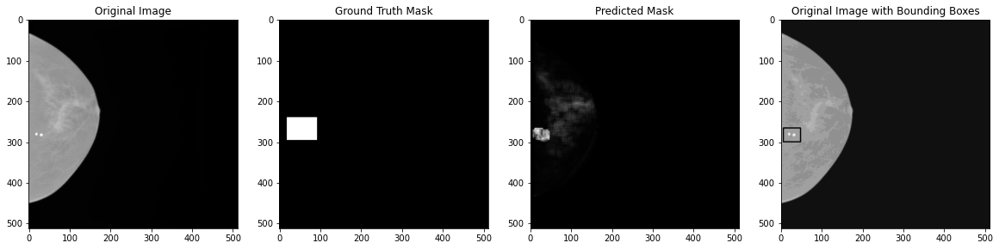


  1%|█                                                                                                                                                                       | 6/1000 [00:02<05:33,  2.98it/s]

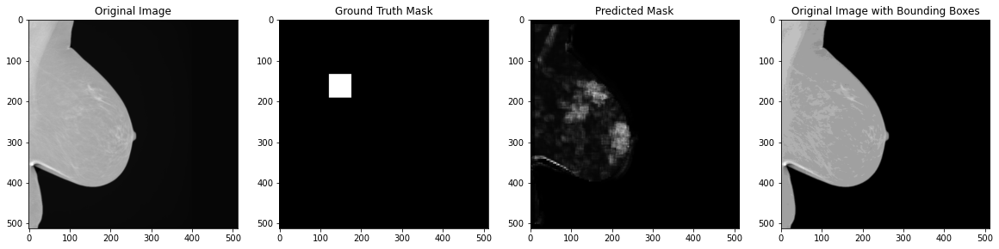


  1%|█▊                                                                                                                                                                     | 11/1000 [00:04<06:14,  2.64it/s]

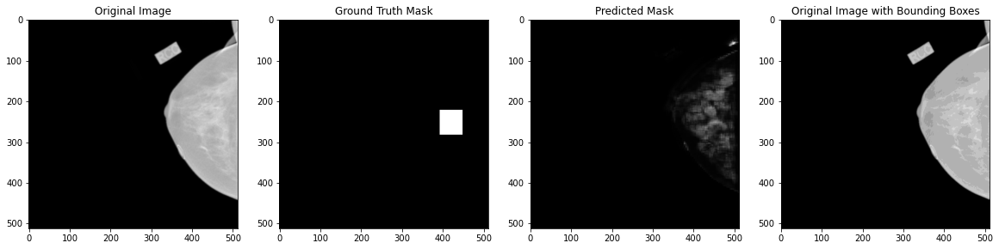


  2%|██▋                                                                                                                                                                    | 16/1000 [00:06<05:44,  2.85it/s]

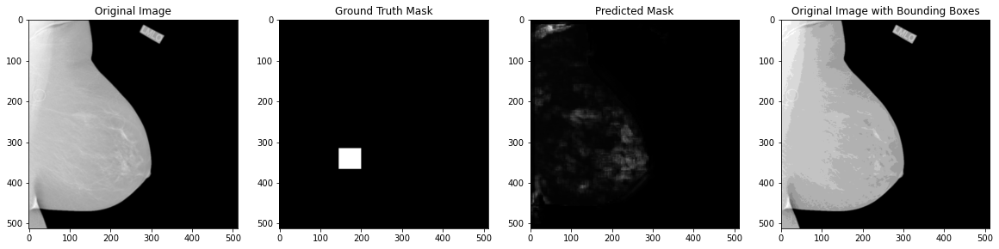


  2%|███▌                                                                                                                                                                   | 21/1000 [00:08<05:42,  2.86it/s]

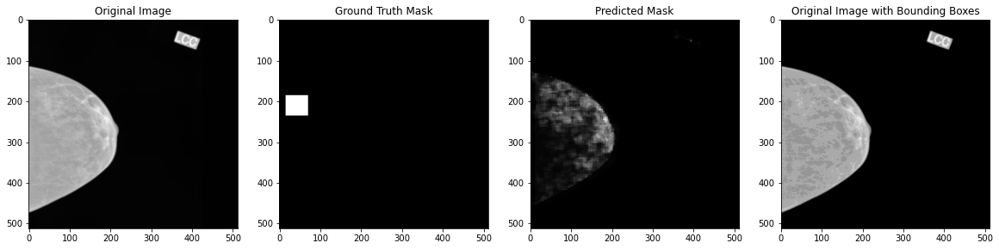


  3%|████▎                                                                                                                                                                  | 26/1000 [00:10<05:38,  2.87it/s]

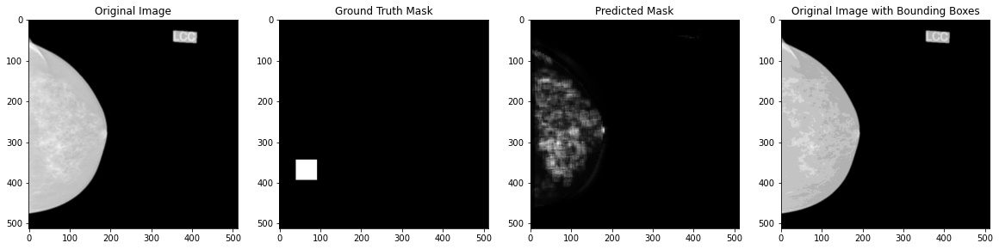


  3%|█████▏                                                                                                                                                                 | 31/1000 [00:11<05:28,  2.95it/s]

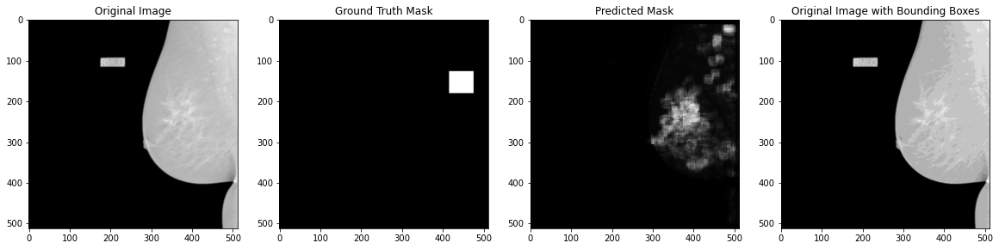


  4%|██████                                                                                                                                                                 | 36/1000 [00:13<05:24,  2.97it/s]

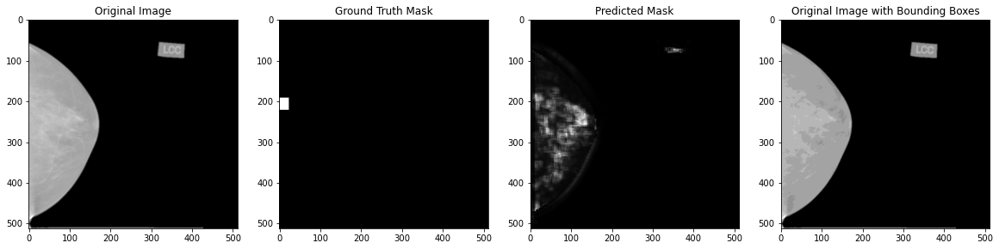


  4%|██████▊                                                                                                                                                                | 41/1000 [00:15<05:35,  2.86it/s]

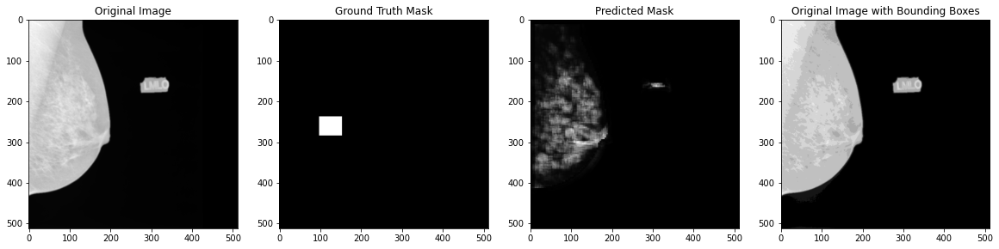


  5%|███████▋                                                                                                                                                               | 46/1000 [00:17<05:28,  2.91it/s]

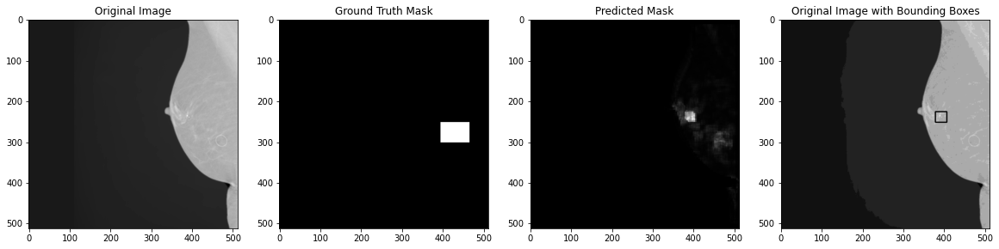


  5%|████████▌                                                                                                                                                              | 51/1000 [00:19<05:39,  2.80it/s]

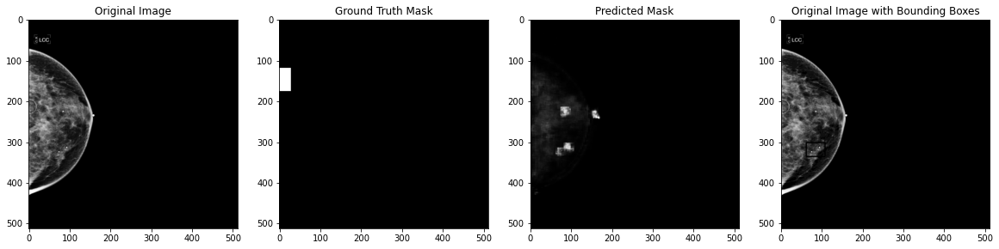


  6%|█████████▎                                                                                                                                                             | 56/1000 [00:21<05:24,  2.91it/s]

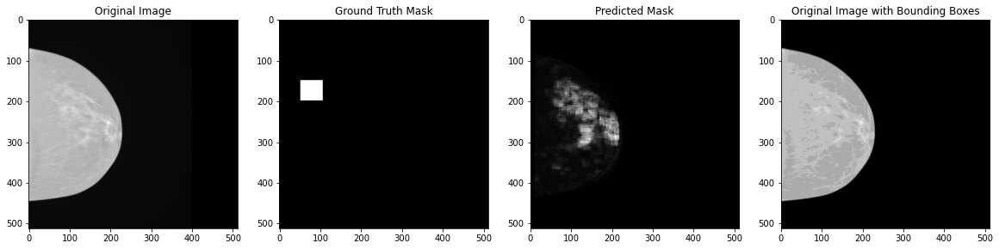


  6%|██████████▏                                                                                                                                                            | 61/1000 [00:23<05:18,  2.95it/s]

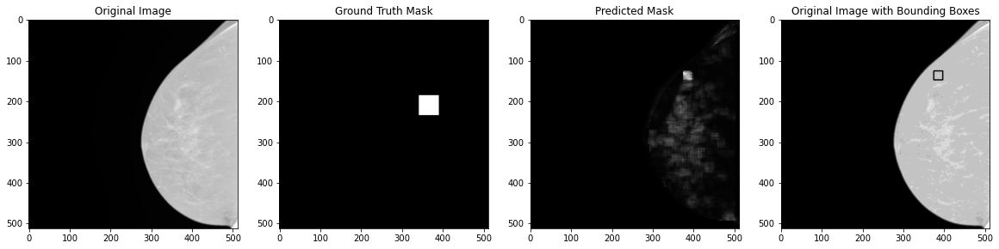


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:24<00:00,  2.59it/s]

  7%|███████████                                                                                                                                                            | 66/1000 [00:25<04:59,  3.12it/s]

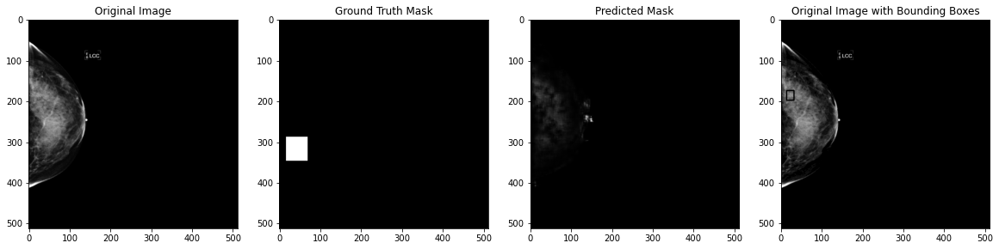


  7%|███████████▊                                                                                                                                                           | 71/1000 [00:27<05:20,  2.90it/s]

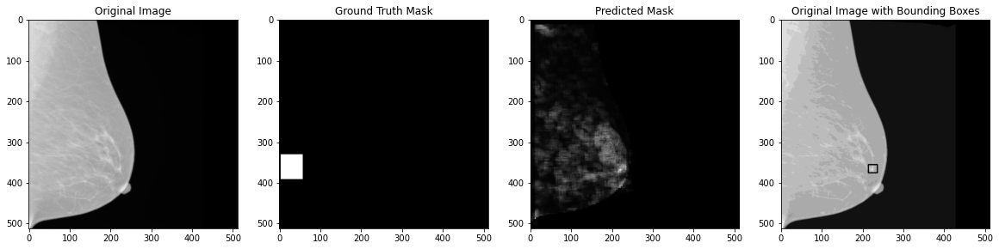


  8%|████████████▋                                                                                                                                                          | 76/1000 [00:29<05:20,  2.88it/s]

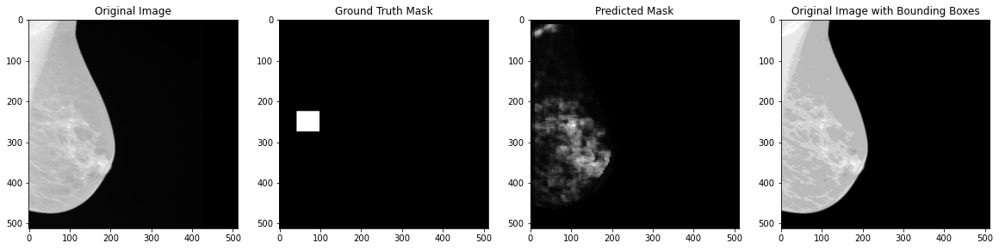


  8%|█████████████▌                                                                                                                                                         | 81/1000 [00:31<05:25,  2.83it/s]

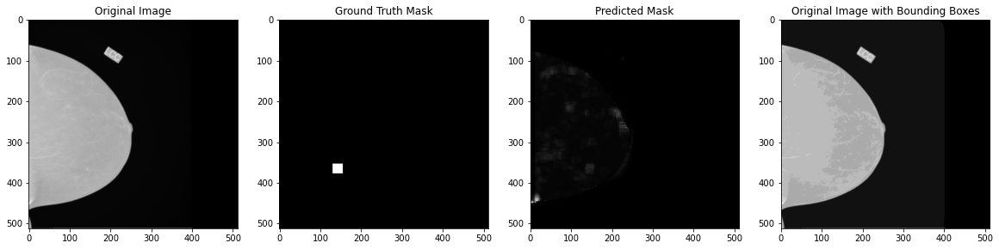


  9%|██████████████▎                                                                                                                                                        | 86/1000 [00:32<05:11,  2.93it/s]

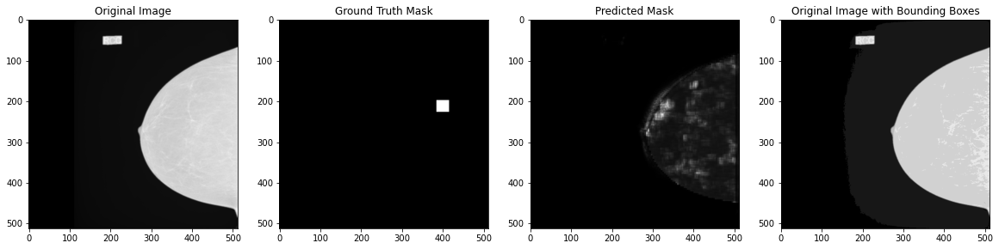


  9%|███████████████▏                                                                                                                                                       | 91/1000 [00:35<05:27,  2.78it/s]

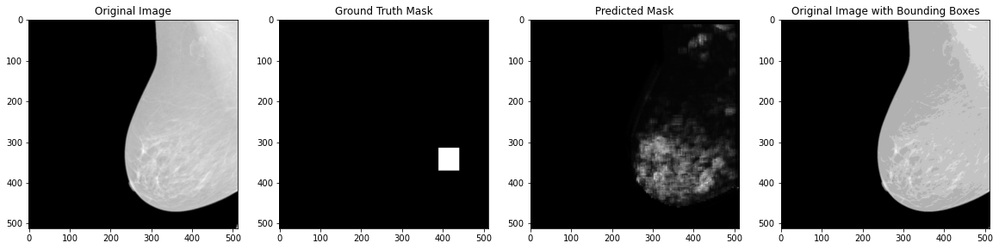


 10%|████████████████                                                                                                                                                       | 96/1000 [00:36<05:13,  2.89it/s]

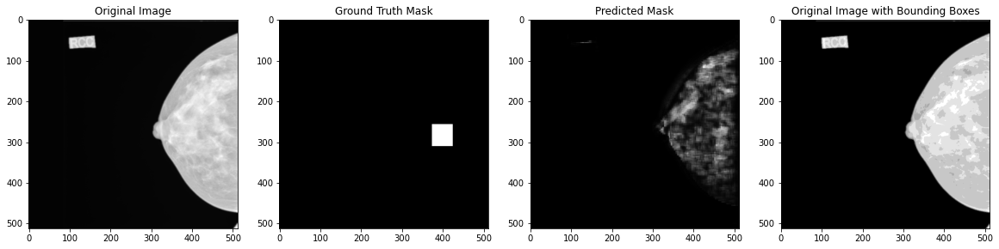


 10%|████████████████▊                                                                                                                                                     | 101/1000 [00:38<05:04,  2.95it/s]

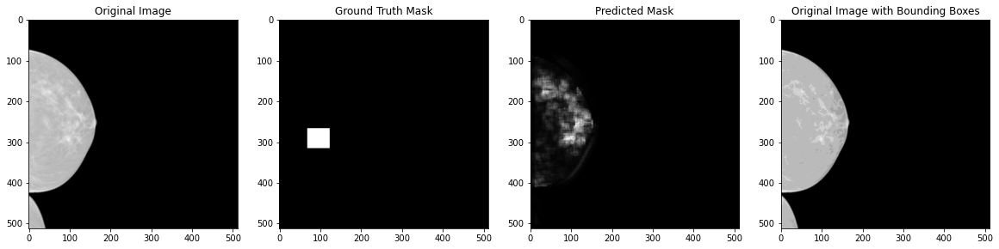


 11%|█████████████████▌                                                                                                                                                    | 106/1000 [00:40<05:27,  2.73it/s]

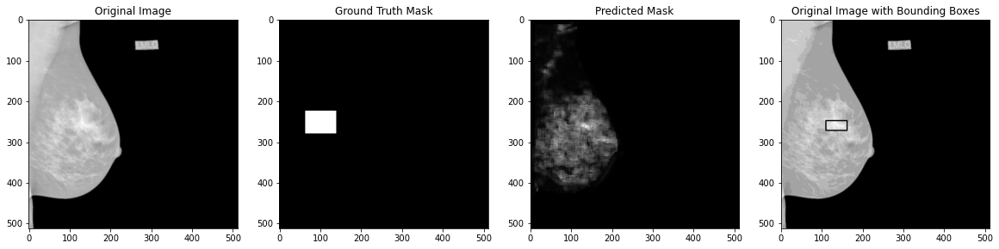


 11%|██████████████████▍                                                                                                                                                   | 111/1000 [00:42<05:03,  2.93it/s]

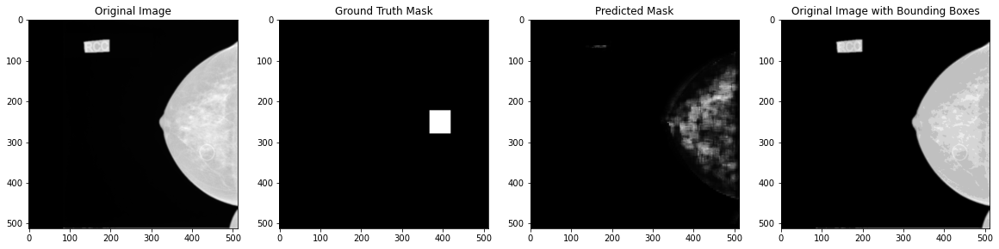


 12%|███████████████████▎                                                                                                                                                  | 116/1000 [00:44<05:04,  2.90it/s]

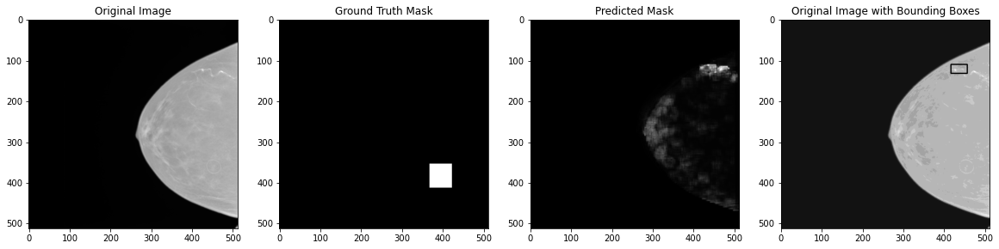


 12%|████████████████████                                                                                                                                                  | 121/1000 [00:46<05:00,  2.92it/s]

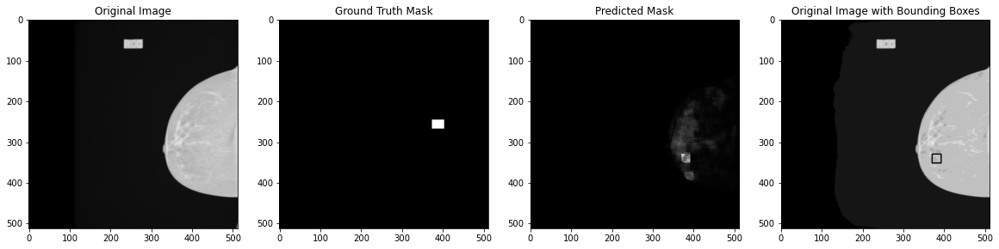


 13%|████████████████████▉                                                                                                                                                 | 126/1000 [00:48<04:30,  3.23it/s]

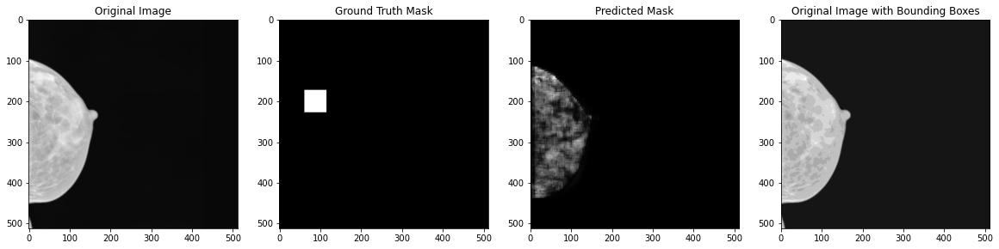


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:24<00:00,  2.56it/s]

 13%|█████████████████████▋                                                                                                                                                | 131/1000 [00:50<05:06,  2.84it/s]

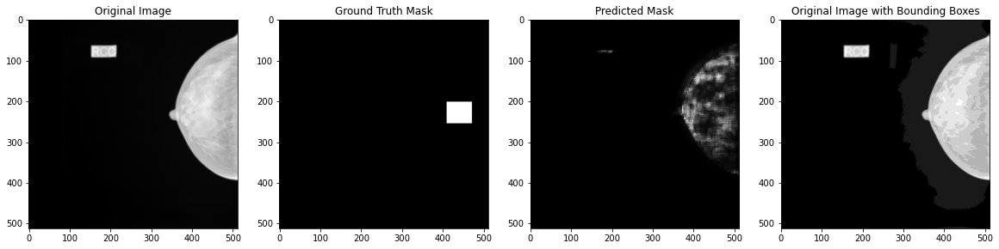


 14%|██████████████████████▌                                                                                                                                               | 136/1000 [00:52<04:59,  2.88it/s]

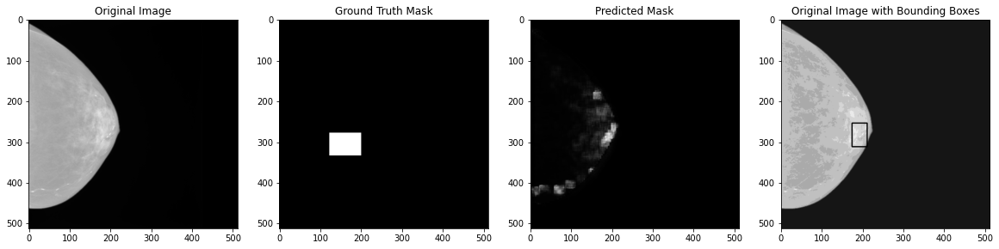


 14%|███████████████████████▍                                                                                                                                              | 141/1000 [00:54<04:51,  2.95it/s]

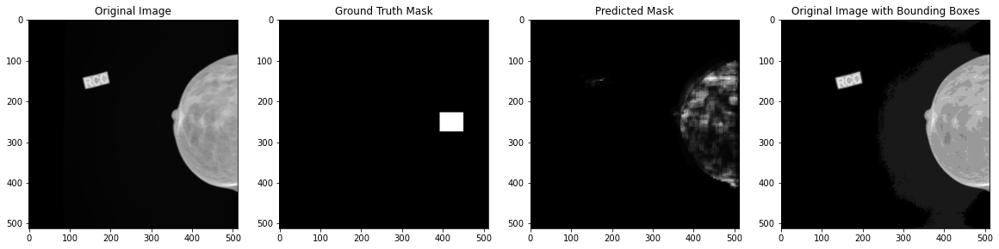


 15%|████████████████████████▏                                                                                                                                             | 146/1000 [00:56<04:58,  2.86it/s]

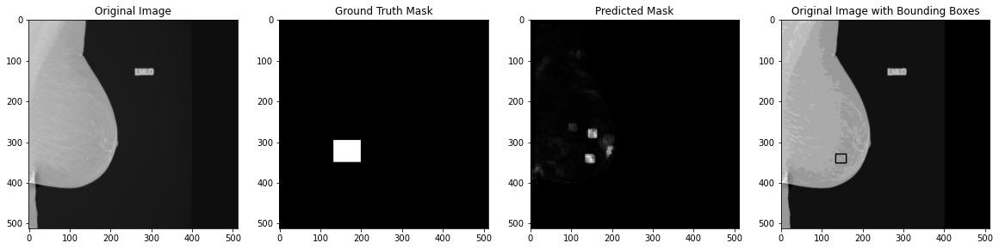


 15%|█████████████████████████                                                                                                                                             | 151/1000 [00:58<04:55,  2.88it/s]

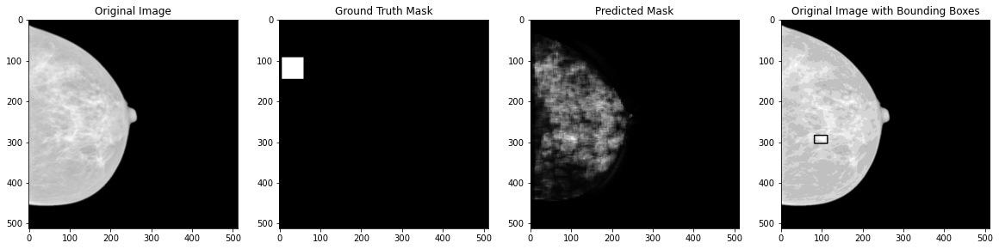


 16%|█████████████████████████▉                                                                                                                                            | 156/1000 [01:00<04:58,  2.83it/s]

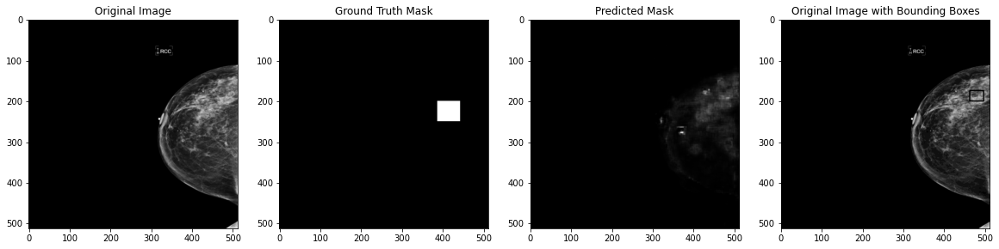


 16%|██████████████████████████▋                                                                                                                                           | 161/1000 [01:02<04:57,  2.82it/s]

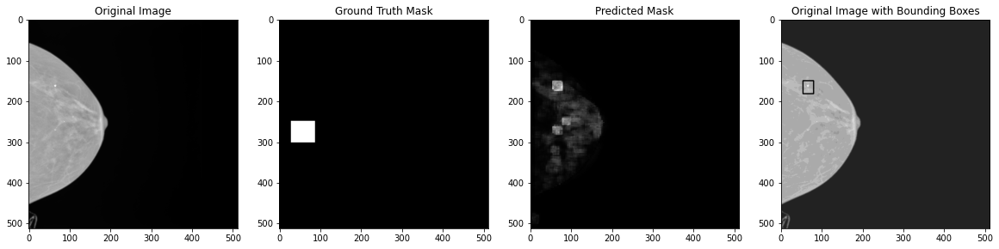


 17%|███████████████████████████▌                                                                                                                                          | 166/1000 [01:04<05:01,  2.76it/s]

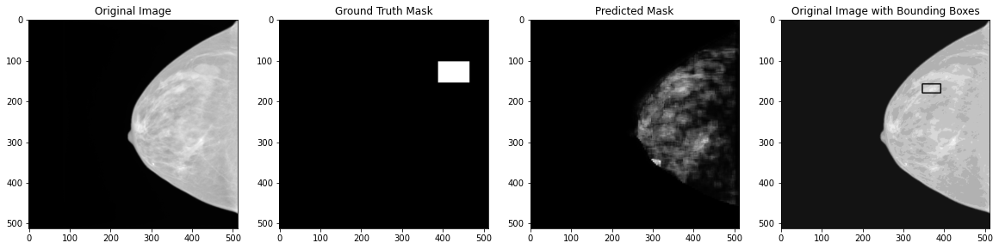


 17%|████████████████████████████▍                                                                                                                                         | 171/1000 [01:05<04:44,  2.92it/s]

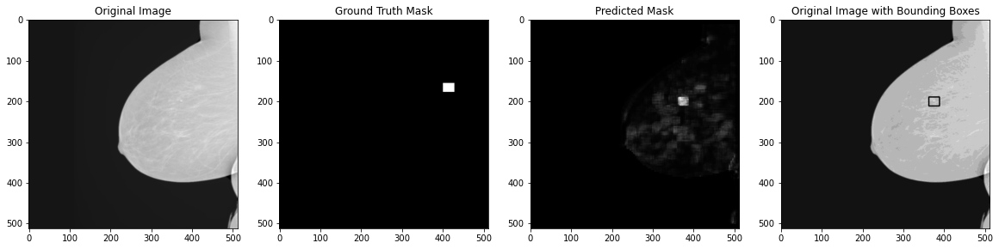


 18%|█████████████████████████████▏                                                                                                                                        | 176/1000 [01:07<04:43,  2.90it/s]

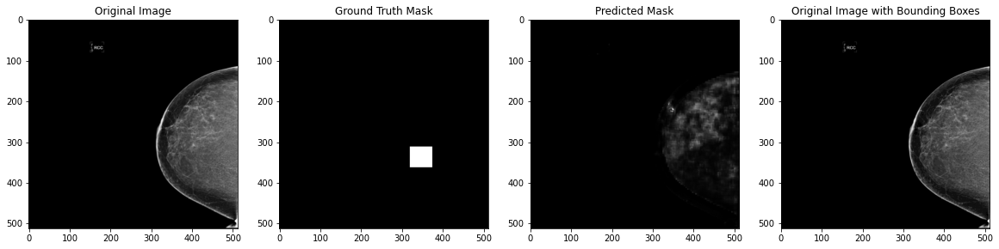


 18%|██████████████████████████████                                                                                                                                        | 181/1000 [01:09<04:42,  2.90it/s]

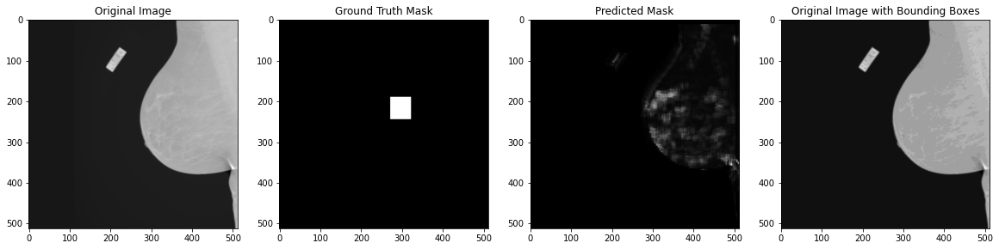


 19%|██████████████████████████████▉                                                                                                                                       | 186/1000 [01:11<04:42,  2.89it/s]

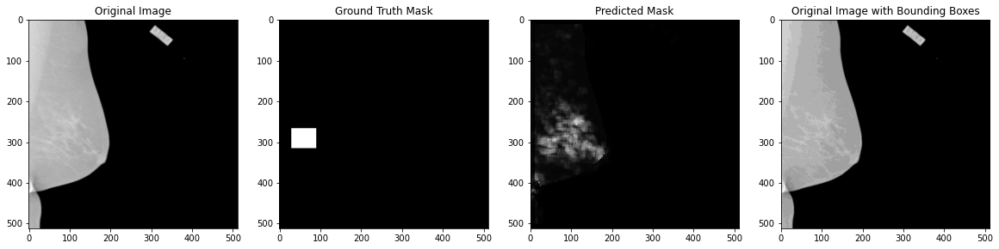


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:23<00:00,  2.64it/s]

 19%|███████████████████████████████▋                                                                                                                                      | 191/1000 [01:13<04:21,  3.10it/s]

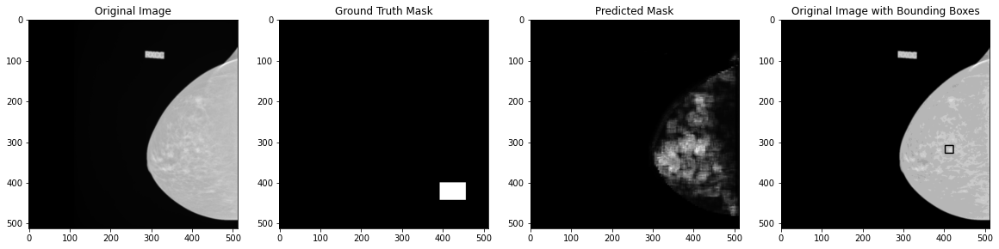


 20%|████████████████████████████████▌                                                                                                                                     | 196/1000 [01:15<04:33,  2.94it/s]

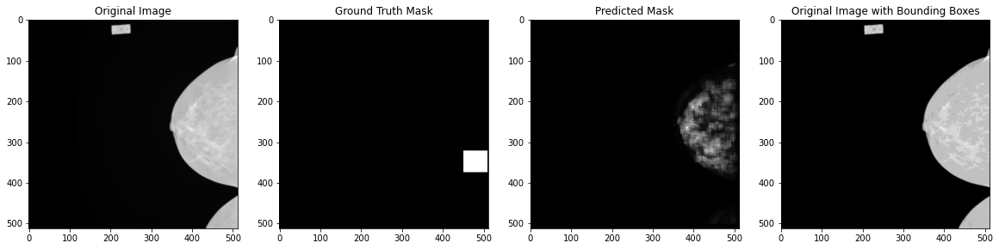


 20%|█████████████████████████████████▎                                                                                                                                    | 201/1000 [01:17<05:24,  2.46it/s]

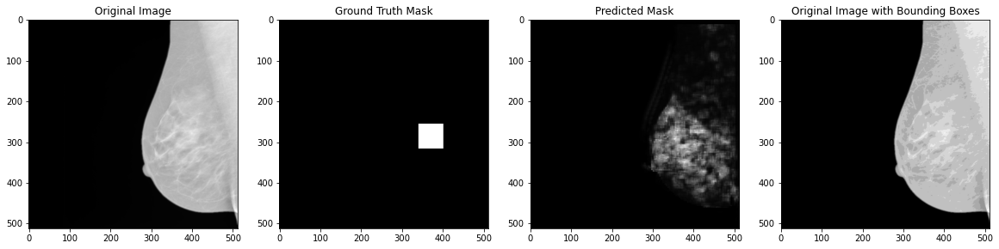


 21%|██████████████████████████████████▏                                                                                                                                   | 206/1000 [01:19<04:51,  2.73it/s]

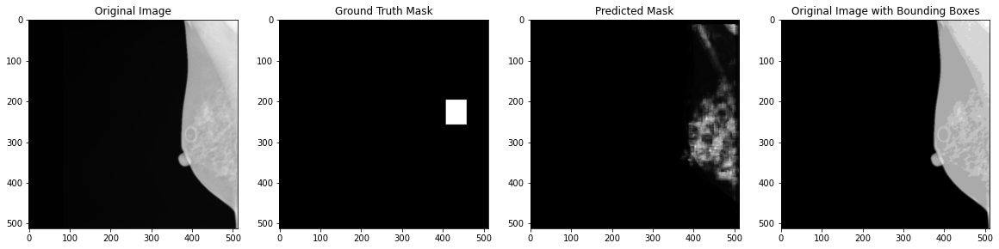


 21%|███████████████████████████████████                                                                                                                                   | 211/1000 [01:21<04:30,  2.92it/s]

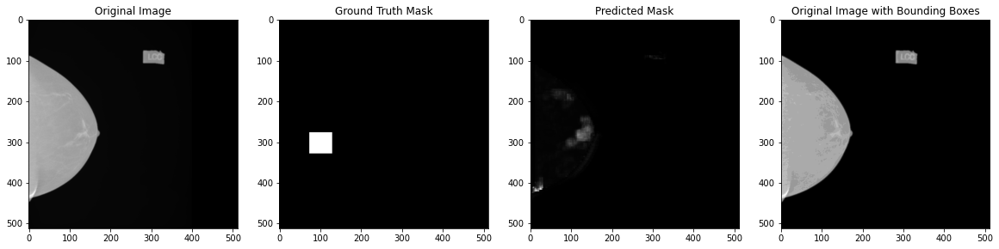


 22%|███████████████████████████████████▊                                                                                                                                  | 216/1000 [01:23<04:31,  2.89it/s]

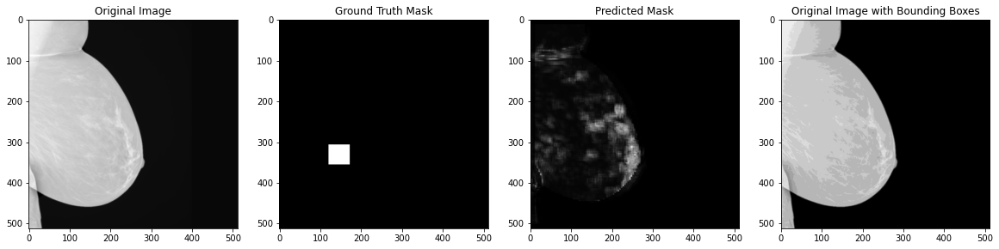


 22%|████████████████████████████████████▋                                                                                                                                 | 221/1000 [01:25<04:37,  2.81it/s]

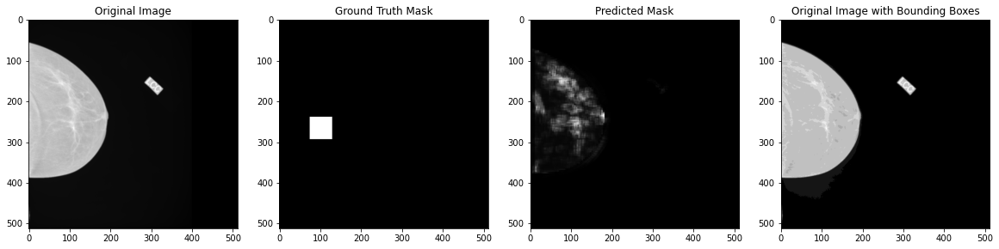


 23%|█████████████████████████████████████▌                                                                                                                                | 226/1000 [01:27<04:24,  2.93it/s]

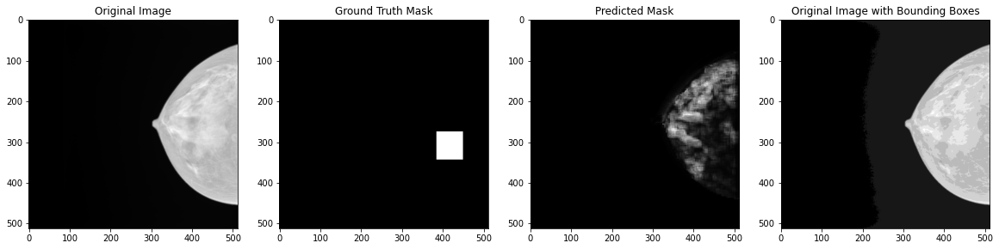


 23%|██████████████████████████████████████▎                                                                                                                               | 231/1000 [01:29<04:25,  2.90it/s]

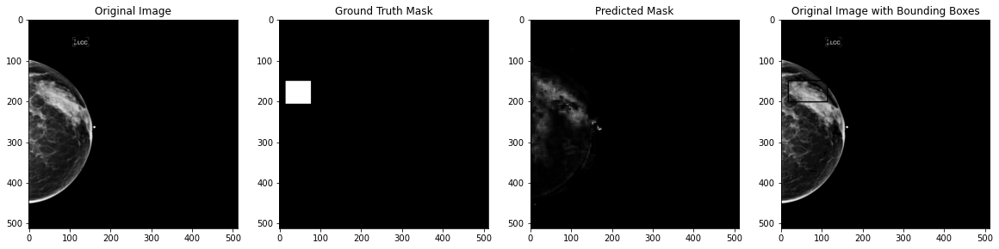


 24%|███████████████████████████████████████▏                                                                                                                              | 236/1000 [01:31<04:53,  2.60it/s]

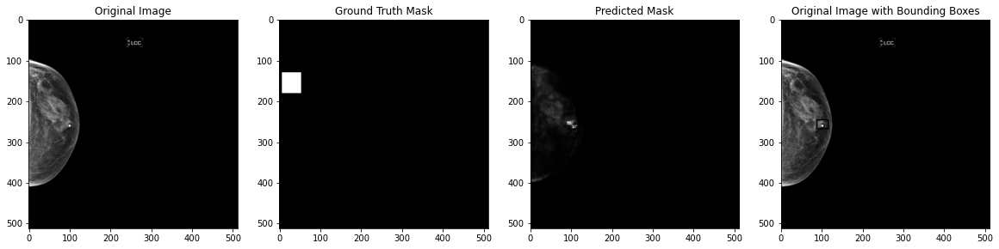


 24%|████████████████████████████████████████                                                                                                                              | 241/1000 [01:33<04:22,  2.89it/s]

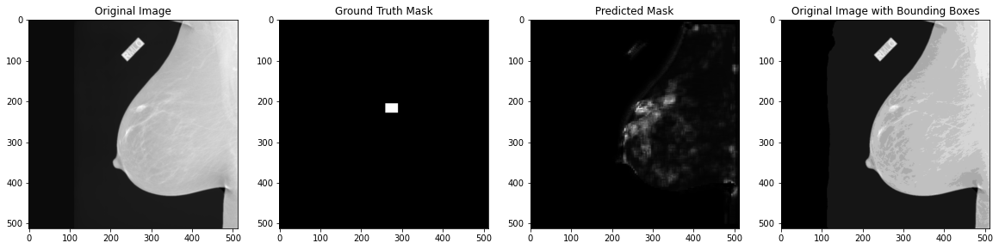


 25%|████████████████████████████████████████▊                                                                                                                             | 246/1000 [01:35<04:23,  2.86it/s]

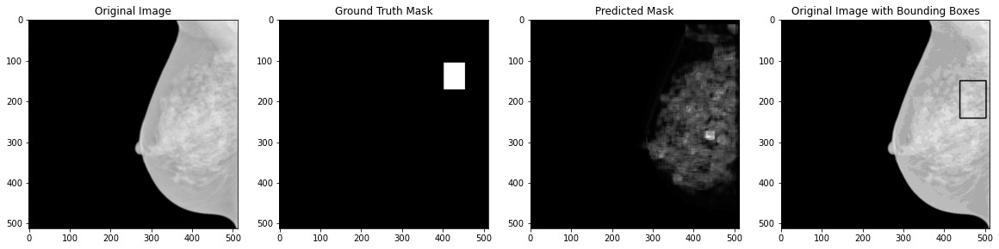


 25%|█████████████████████████████████████████▋                                                                                                                            | 251/1000 [01:37<04:25,  2.82it/s]

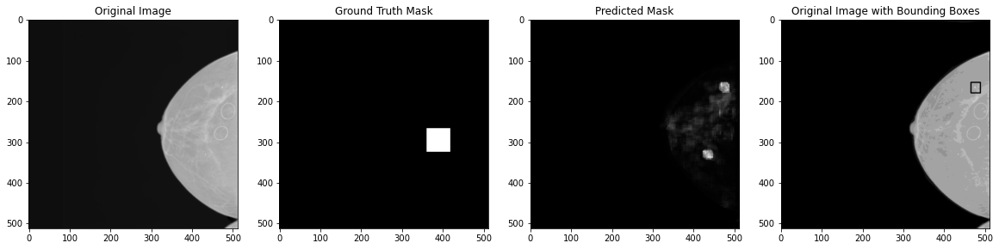


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:24<00:00,  2.55it/s]

 26%|██████████████████████████████████████████▍                                                                                                                           | 256/1000 [01:38<04:05,  3.03it/s]

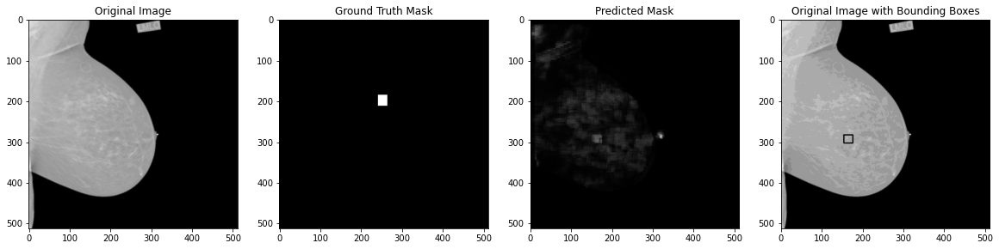


 26%|███████████████████████████████████████████▎                                                                                                                          | 261/1000 [01:40<04:14,  2.90it/s]

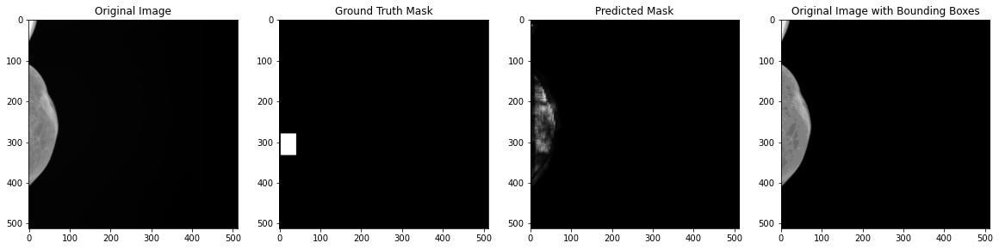


 27%|████████████████████████████████████████████▏                                                                                                                         | 266/1000 [01:42<04:06,  2.98it/s]

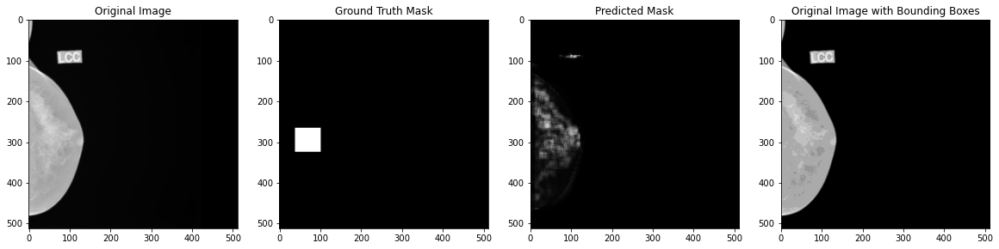


 27%|████████████████████████████████████████████▉                                                                                                                         | 271/1000 [01:44<04:10,  2.91it/s]

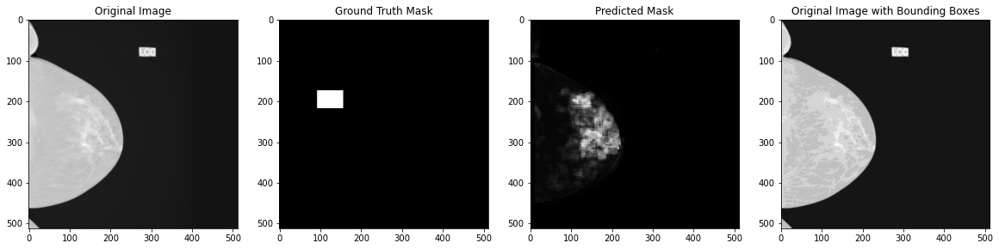


 28%|█████████████████████████████████████████████▊                                                                                                                        | 276/1000 [01:46<04:15,  2.83it/s]

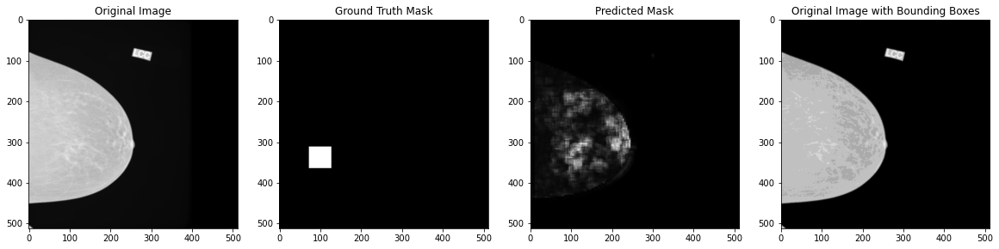


 28%|██████████████████████████████████████████████▋                                                                                                                       | 281/1000 [01:48<04:12,  2.84it/s]

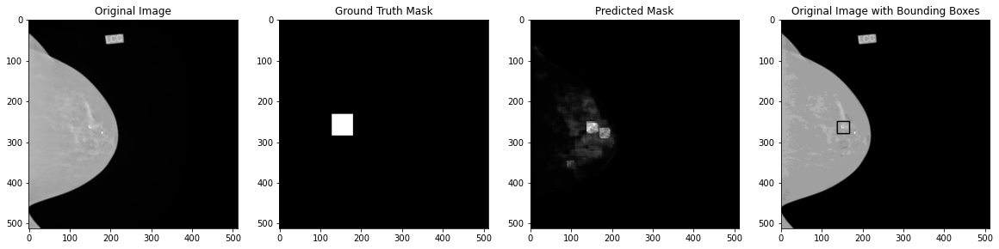


 29%|███████████████████████████████████████████████▍                                                                                                                      | 286/1000 [01:50<04:09,  2.87it/s]

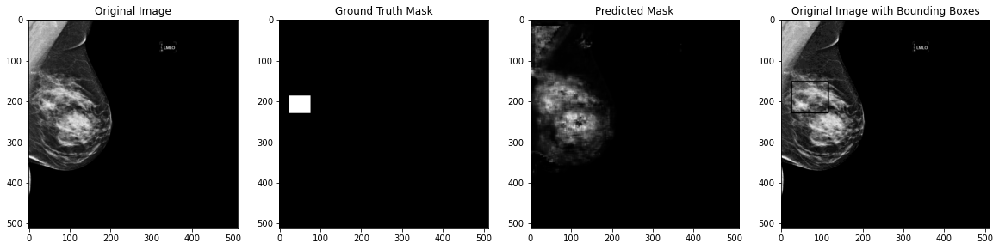


 29%|████████████████████████████████████████████████▎                                                                                                                     | 291/1000 [01:52<04:01,  2.94it/s]

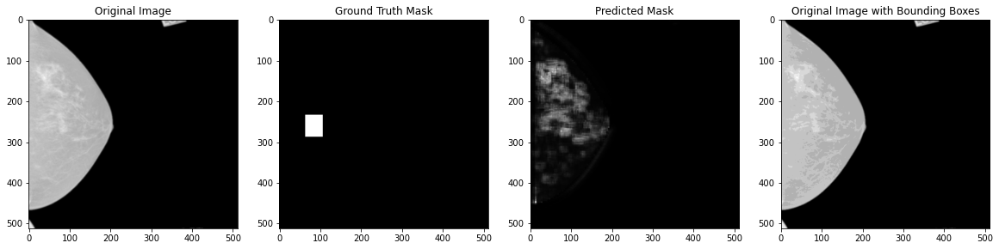


 30%|█████████████████████████████████████████████████▏                                                                                                                    | 296/1000 [01:54<04:03,  2.89it/s]

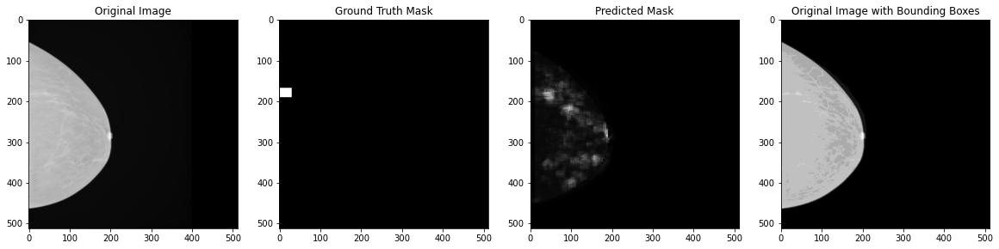


 30%|█████████████████████████████████████████████████▉                                                                                                                    | 301/1000 [01:56<04:04,  2.86it/s]

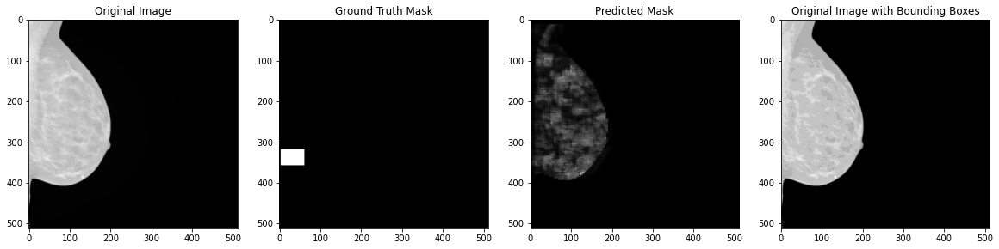


 31%|██████████████████████████████████████████████████▊                                                                                                                   | 306/1000 [01:57<03:53,  2.98it/s]

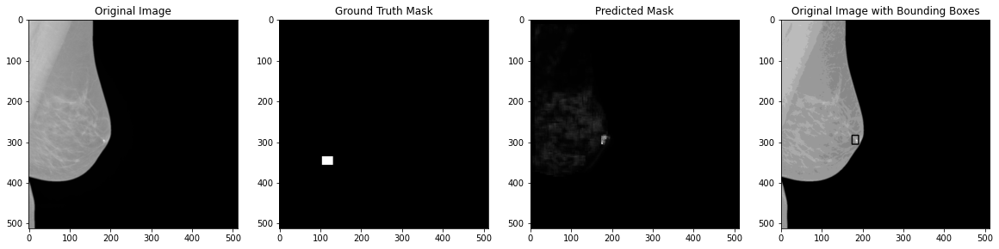


 31%|███████████████████████████████████████████████████▋                                                                                                                  | 311/1000 [01:59<04:02,  2.85it/s]

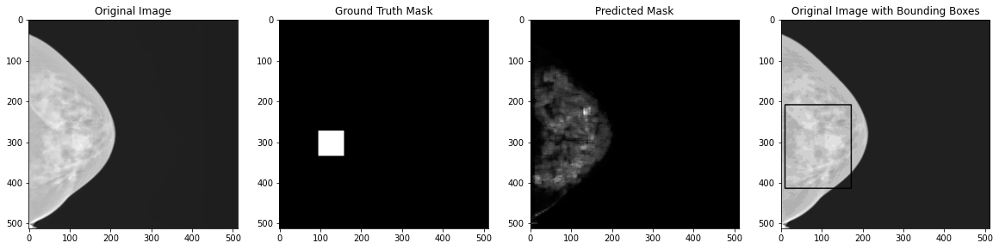


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:24<00:00,  2.62it/s]

 32%|████████████████████████████████████████████████████▍                                                                                                                 | 316/1000 [02:01<03:43,  3.06it/s]

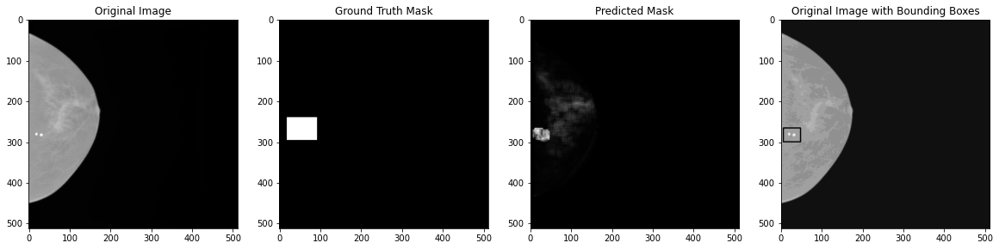


 32%|█████████████████████████████████████████████████████▎                                                                                                                | 321/1000 [02:03<03:47,  2.98it/s]

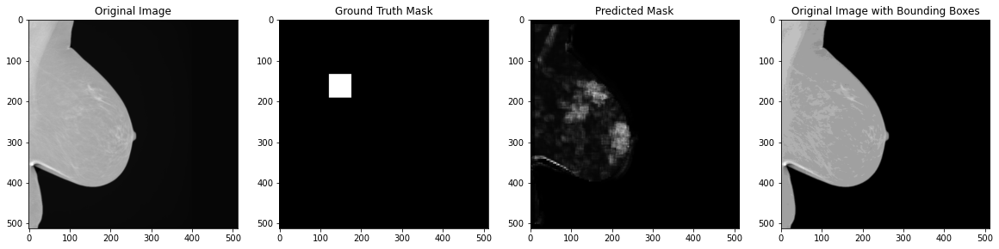


 33%|██████████████████████████████████████████████████████                                                                                                                | 326/1000 [02:05<03:50,  2.93it/s]

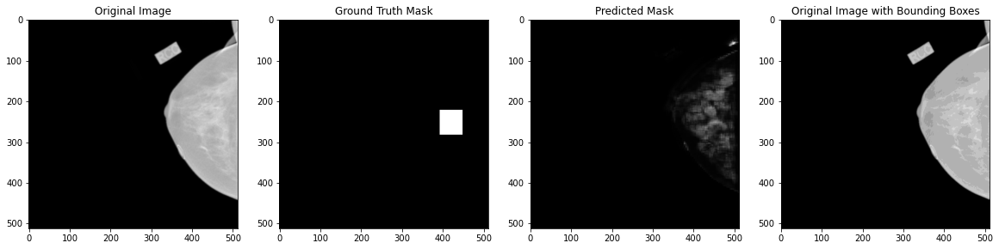


 33%|██████████████████████████████████████████████████████▉                                                                                                               | 331/1000 [02:07<03:46,  2.96it/s]

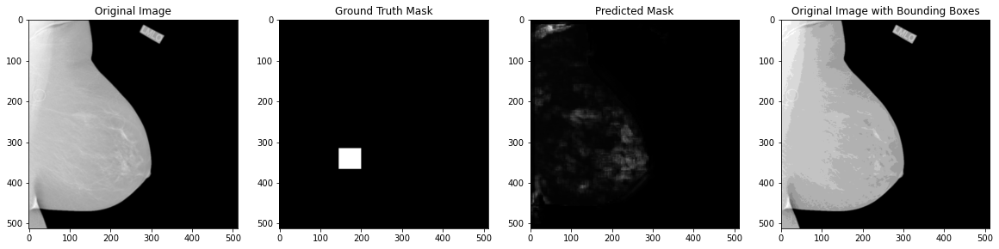


 34%|███████████████████████████████████████████████████████▊                                                                                                              | 336/1000 [02:09<03:48,  2.91it/s]

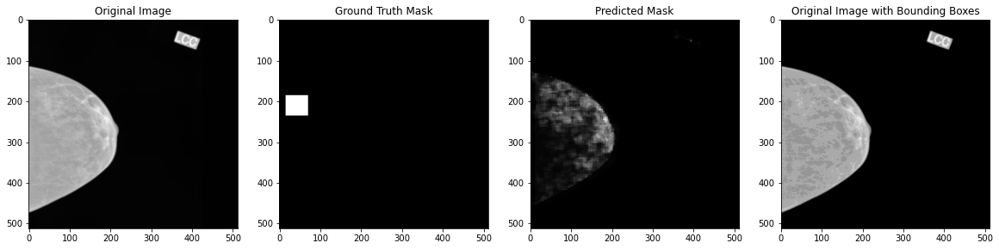


 34%|████████████████████████████████████████████████████████▌                                                                                                             | 341/1000 [02:11<03:47,  2.90it/s]

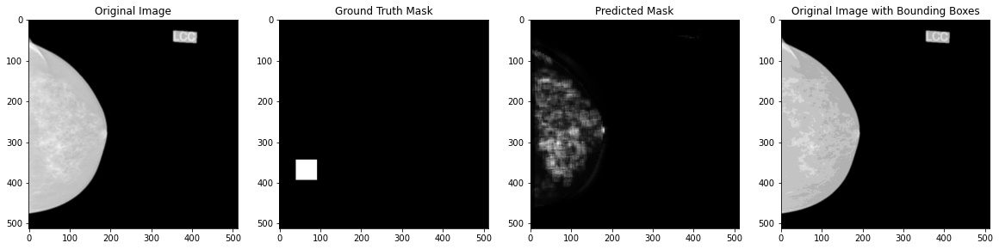


 35%|█████████████████████████████████████████████████████████▍                                                                                                            | 346/1000 [02:13<03:41,  2.95it/s]

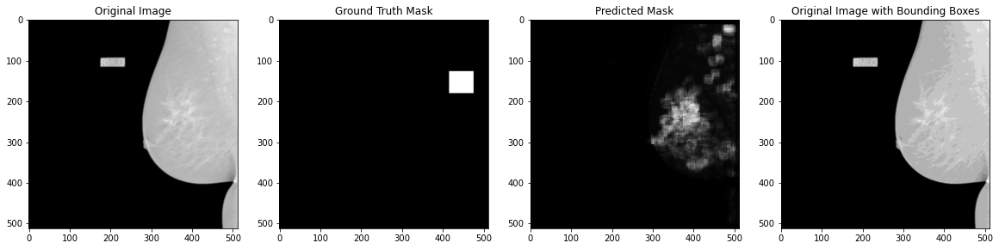


 35%|██████████████████████████████████████████████████████████▎                                                                                                           | 351/1000 [02:15<03:46,  2.86it/s]

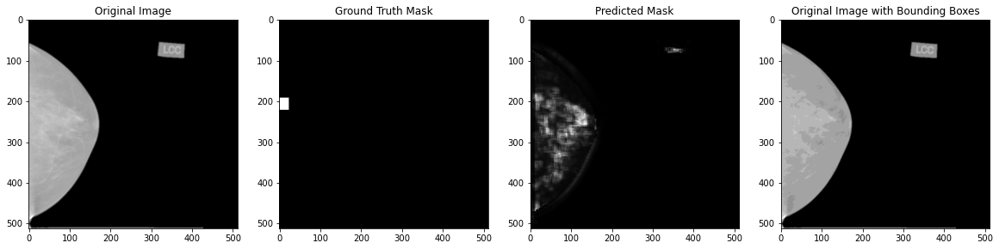


 36%|███████████████████████████████████████████████████████████                                                                                                           | 356/1000 [02:17<03:45,  2.85it/s]

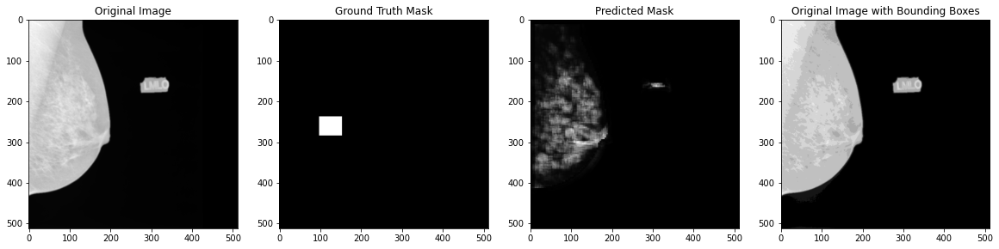


 36%|███████████████████████████████████████████████████████████▉                                                                                                          | 361/1000 [02:19<03:44,  2.84it/s]

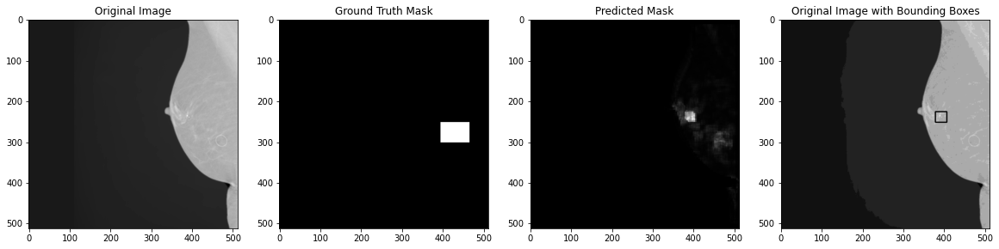


 37%|████████████████████████████████████████████████████████████▊                                                                                                         | 366/1000 [02:20<03:36,  2.93it/s]

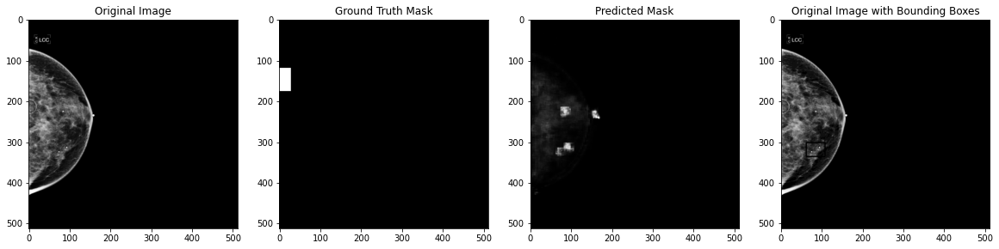


 37%|█████████████████████████████████████████████████████████████▌                                                                                                        | 371/1000 [02:22<03:31,  2.97it/s]

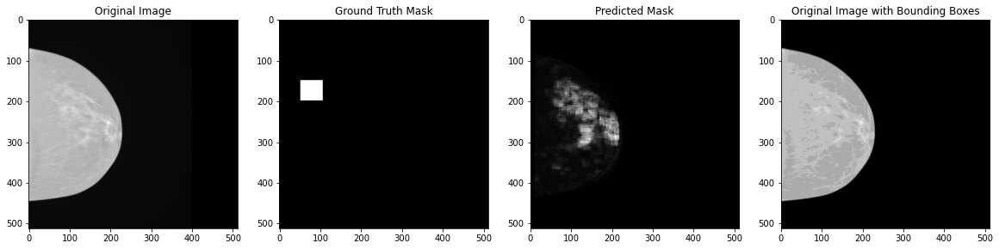


 38%|██████████████████████████████████████████████████████████████▍                                                                                                       | 376/1000 [02:24<03:35,  2.90it/s]

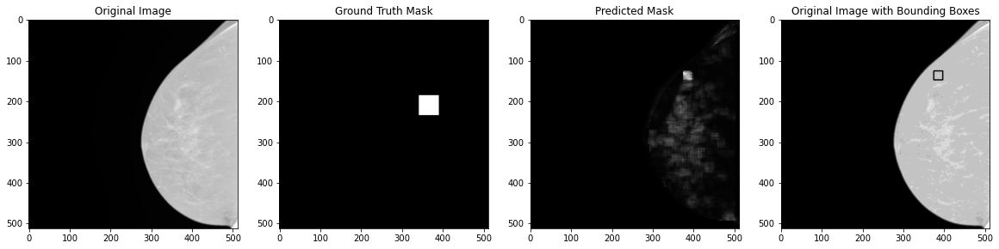


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:23<00:00,  2.63it/s]

 38%|███████████████████████████████████████████████████████████████▏                                                                                                      | 381/1000 [02:26<03:22,  3.06it/s]

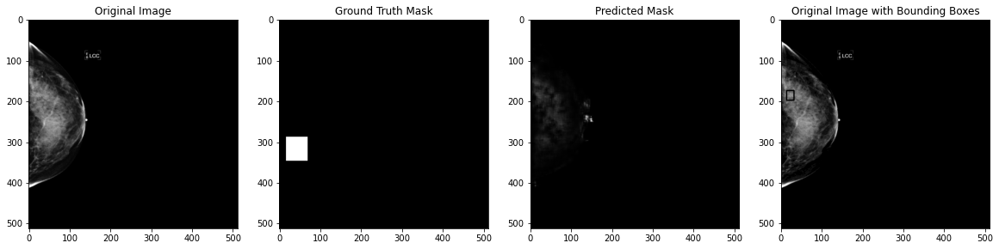


 39%|████████████████████████████████████████████████████████████████                                                                                                      | 386/1000 [02:28<03:34,  2.87it/s]

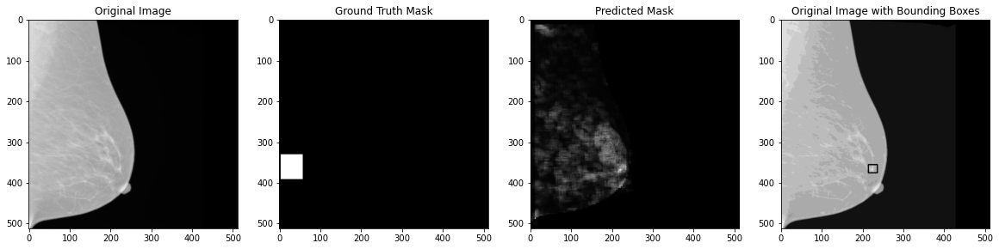


 39%|████████████████████████████████████████████████████████████████▉                                                                                                     | 391/1000 [02:30<03:38,  2.79it/s]

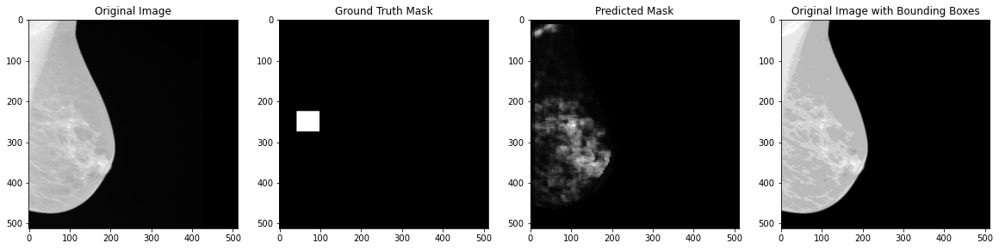


 40%|█████████████████████████████████████████████████████████████████▋                                                                                                    | 396/1000 [02:32<03:32,  2.85it/s]

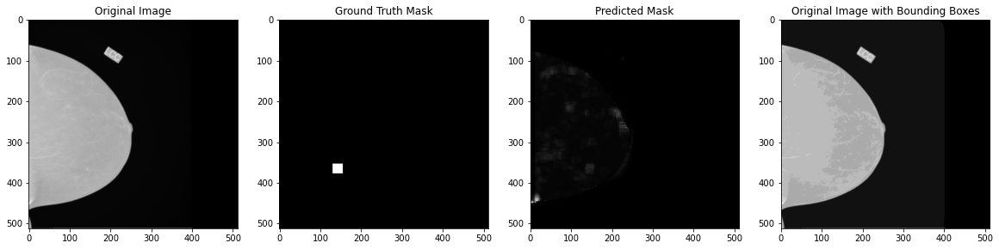


 40%|██████████████████████████████████████████████████████████████████▌                                                                                                   | 401/1000 [02:34<03:27,  2.89it/s]

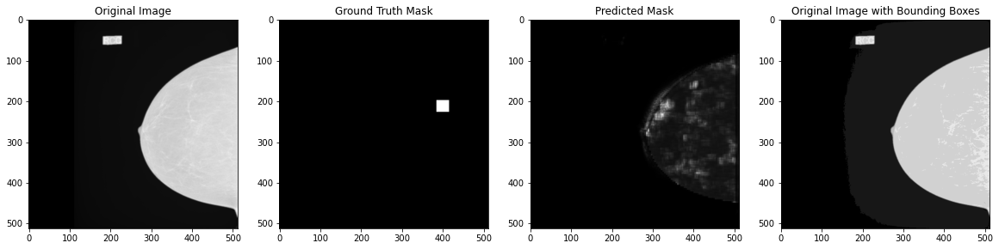


 41%|███████████████████████████████████████████████████████████████████▍                                                                                                  | 406/1000 [02:36<03:35,  2.75it/s]

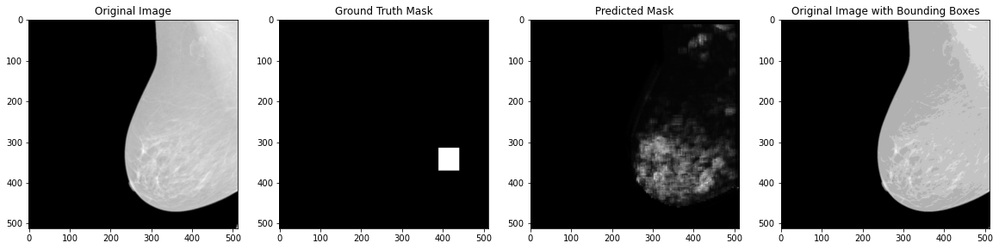


 41%|████████████████████████████████████████████████████████████████████▏                                                                                                 | 411/1000 [02:38<03:25,  2.87it/s]

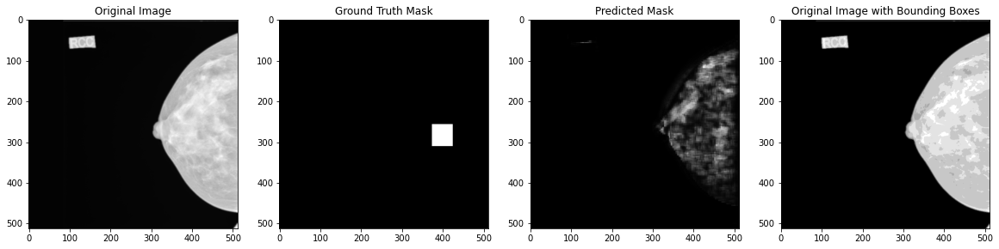


 42%|█████████████████████████████████████████████████████████████████████                                                                                                 | 416/1000 [02:40<03:16,  2.97it/s]

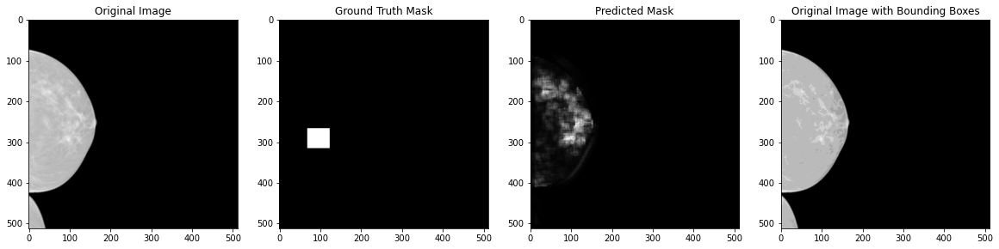


 42%|█████████████████████████████████████████████████████████████████████▉                                                                                                | 421/1000 [02:42<03:21,  2.87it/s]

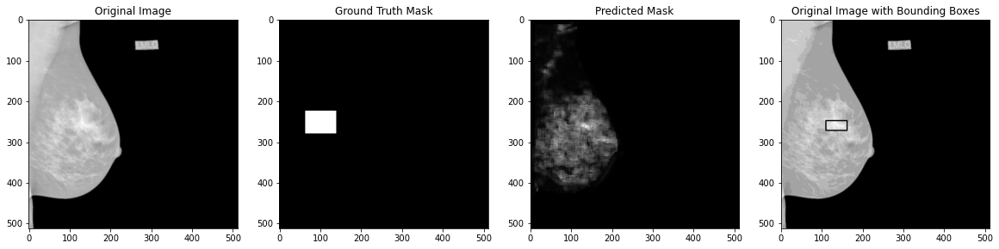


 43%|██████████████████████████████████████████████████████████████████████▋                                                                                               | 426/1000 [02:44<03:22,  2.84it/s]

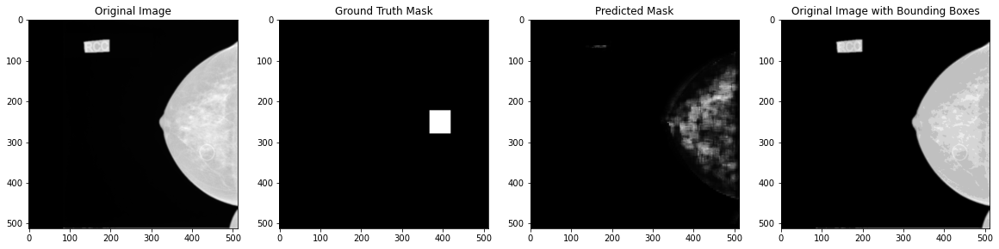


 43%|███████████████████████████████████████████████████████████████████████▌                                                                                              | 431/1000 [02:46<03:18,  2.86it/s]

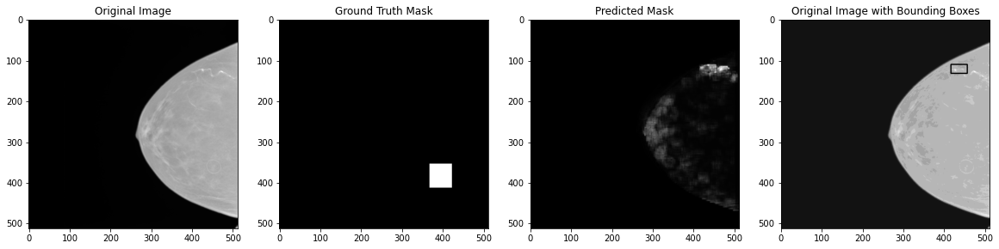


 44%|████████████████████████████████████████████████████████████████████████▍                                                                                             | 436/1000 [02:48<03:18,  2.85it/s]

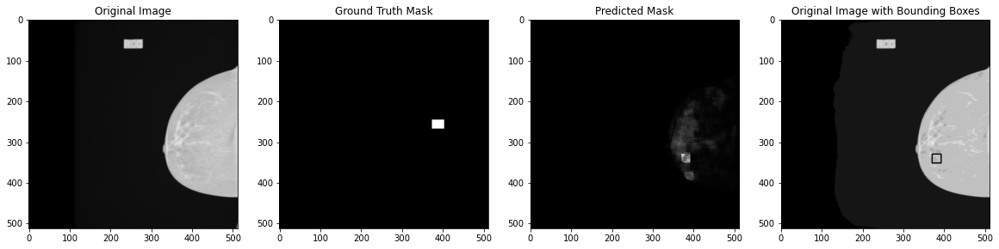


 44%|█████████████████████████████████████████████████████████████████████████▏                                                                                            | 441/1000 [02:49<02:43,  3.41it/s]

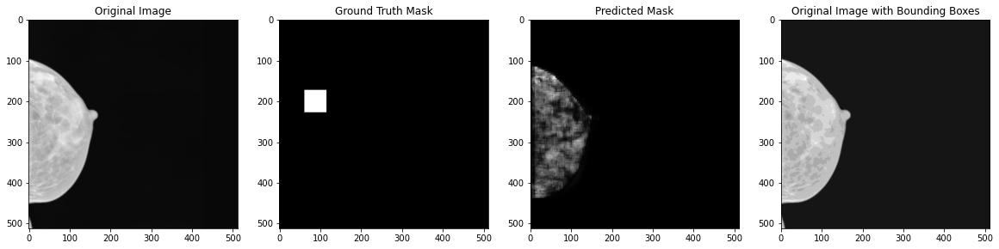


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:24<00:00,  2.56it/s]

 45%|██████████████████████████████████████████████████████████████████████████                                                                                            | 446/1000 [02:51<03:05,  2.99it/s]

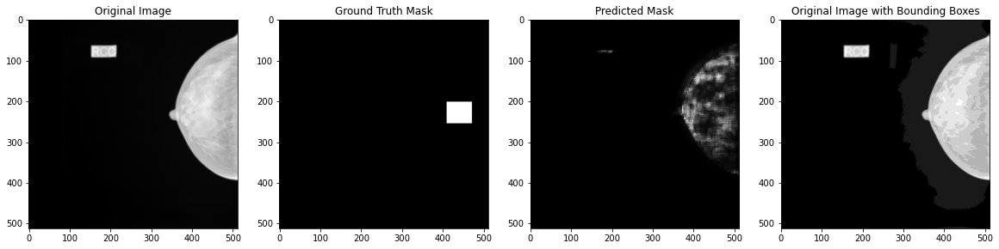


 45%|██████████████████████████████████████████████████████████████████████████▊                                                                                           | 451/1000 [02:53<03:06,  2.95it/s]

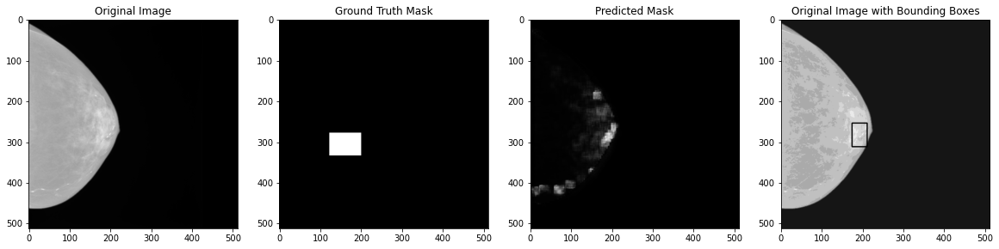


 46%|███████████████████████████████████████████████████████████████████████████▋                                                                                          | 456/1000 [02:55<03:08,  2.88it/s]

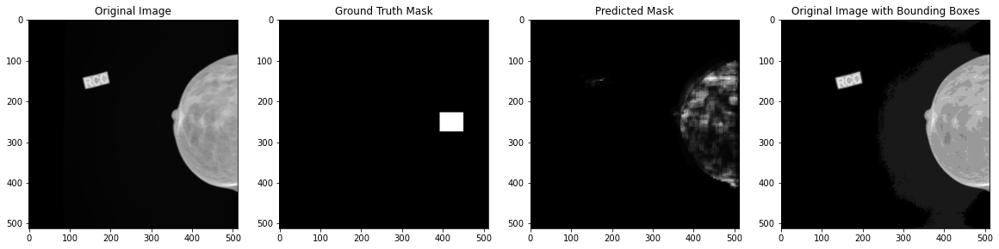


 46%|████████████████████████████████████████████████████████████████████████████▌                                                                                         | 461/1000 [02:57<03:09,  2.84it/s]

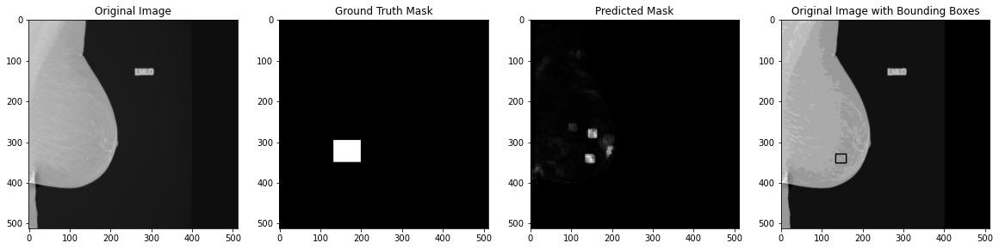


 47%|█████████████████████████████████████████████████████████████████████████████▎                                                                                        | 466/1000 [02:59<03:04,  2.90it/s]

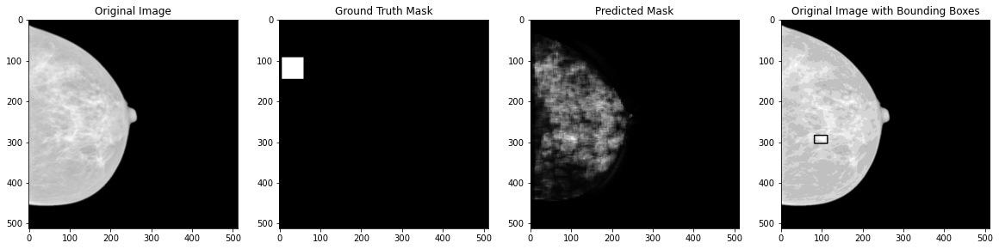


 47%|██████████████████████████████████████████████████████████████████████████████▏                                                                                       | 471/1000 [03:01<03:03,  2.89it/s]

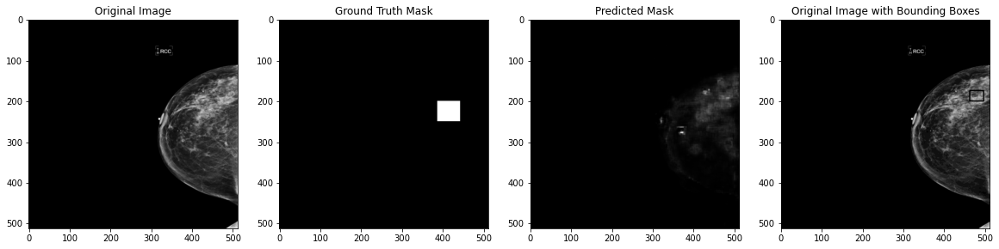


 48%|███████████████████████████████████████████████████████████████████████████████                                                                                       | 476/1000 [03:03<02:57,  2.96it/s]

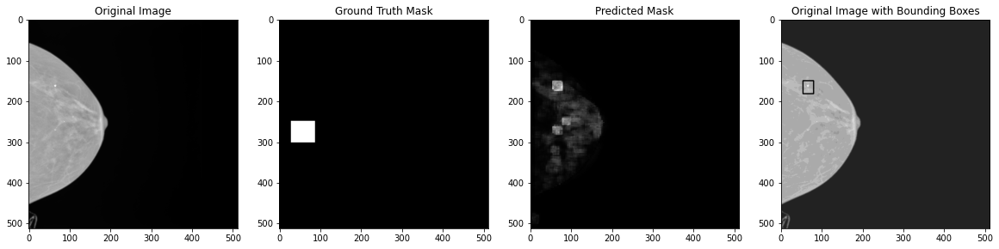


 48%|███████████████████████████████████████████████████████████████████████████████▊                                                                                      | 481/1000 [03:05<02:58,  2.90it/s]

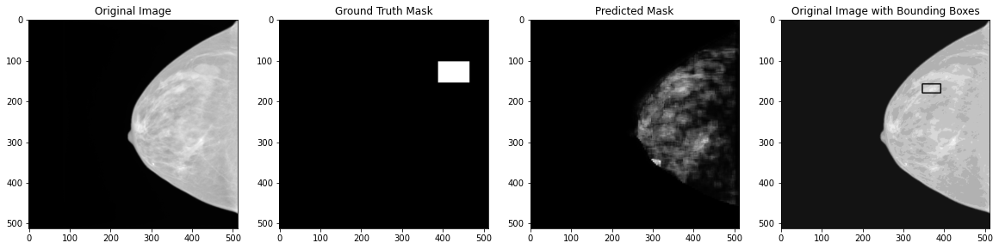


 49%|████████████████████████████████████████████████████████████████████████████████▋                                                                                     | 486/1000 [03:07<03:01,  2.84it/s]

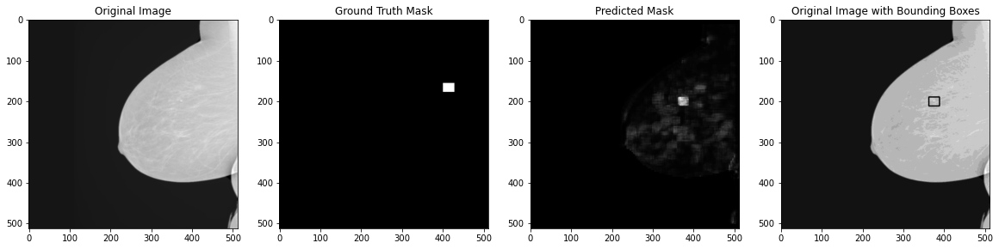


 49%|█████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 491/1000 [03:08<02:52,  2.95it/s]

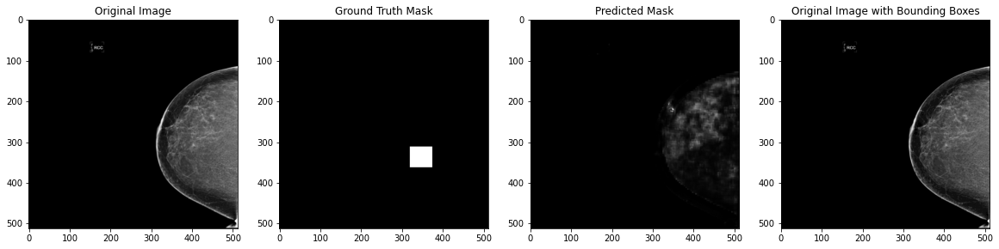


 50%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                   | 496/1000 [03:10<02:55,  2.88it/s]

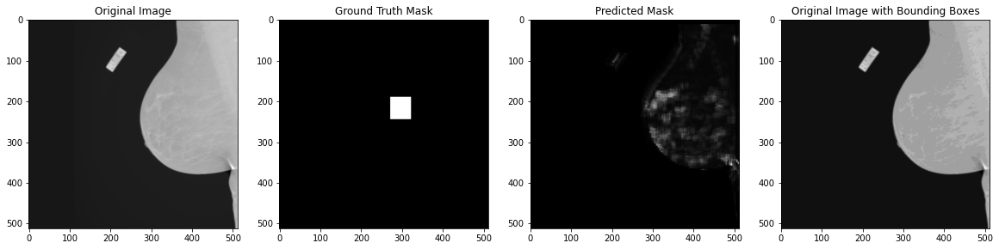


 50%|███████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 501/1000 [03:12<02:46,  3.00it/s]

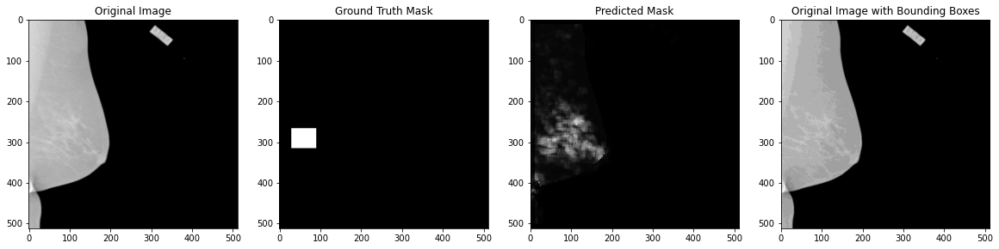


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:23<00:00,  2.65it/s]

 51%|███████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 506/1000 [03:14<02:37,  3.15it/s]

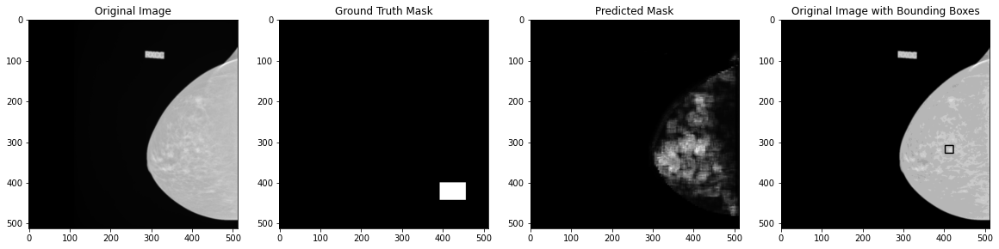


 51%|████████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 511/1000 [03:16<02:52,  2.83it/s]

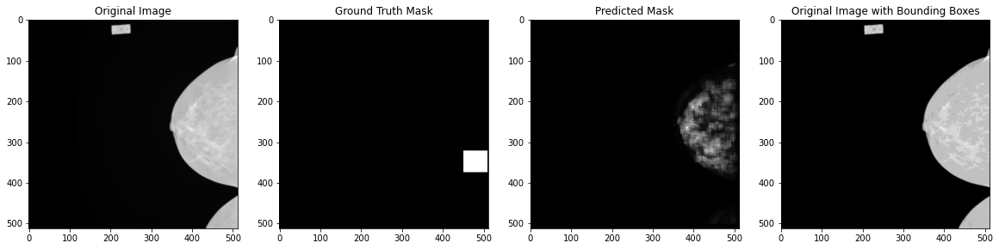


 52%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                                | 516/1000 [03:18<02:46,  2.91it/s]

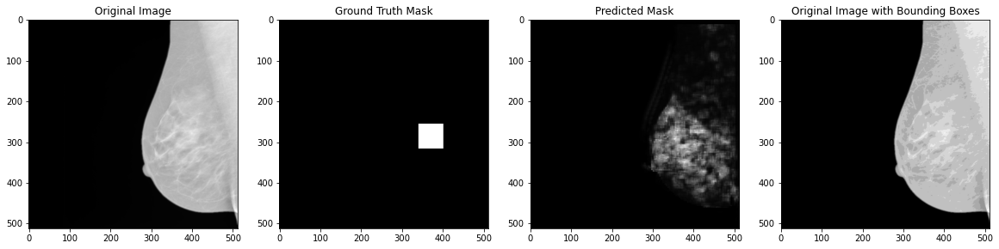


 52%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                               | 521/1000 [03:20<02:58,  2.68it/s]

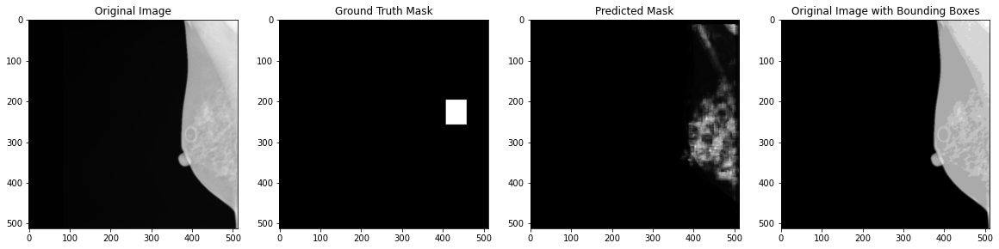


 53%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 526/1000 [03:22<02:45,  2.86it/s]

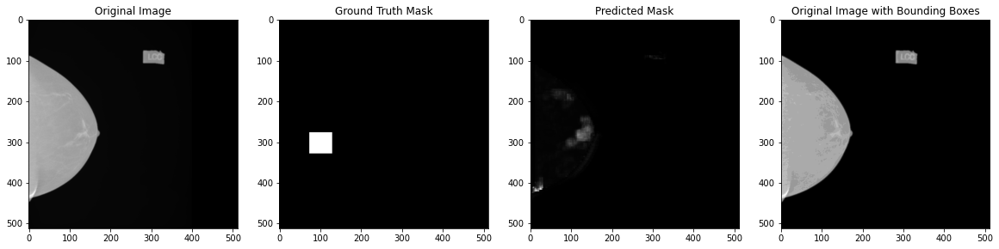


 53%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 531/1000 [03:24<02:38,  2.95it/s]

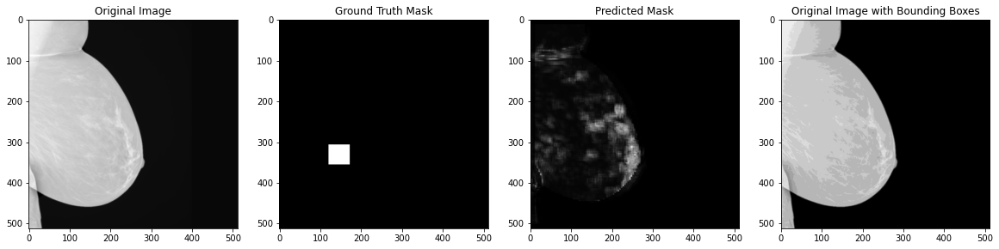


 54%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 536/1000 [03:26<02:47,  2.77it/s]

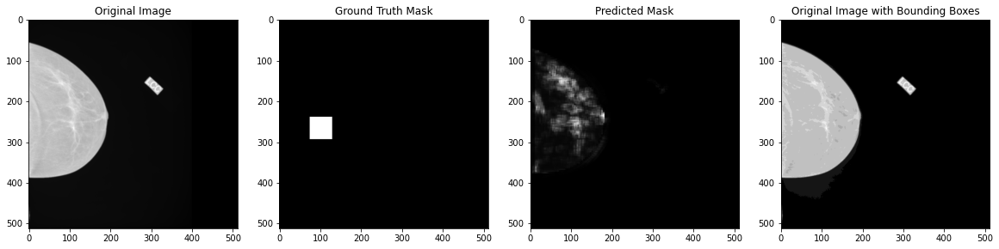


 54%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 541/1000 [03:28<02:39,  2.88it/s]

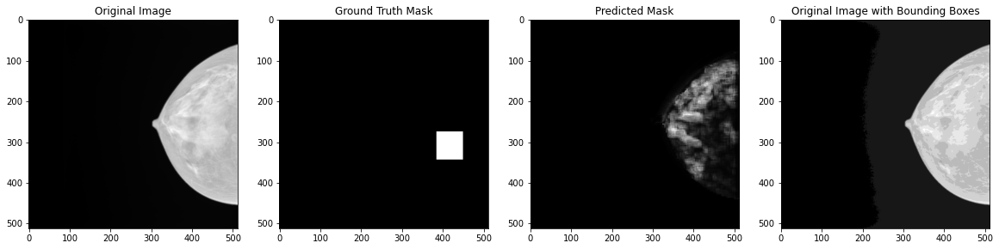


 55%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 546/1000 [03:30<02:39,  2.85it/s]

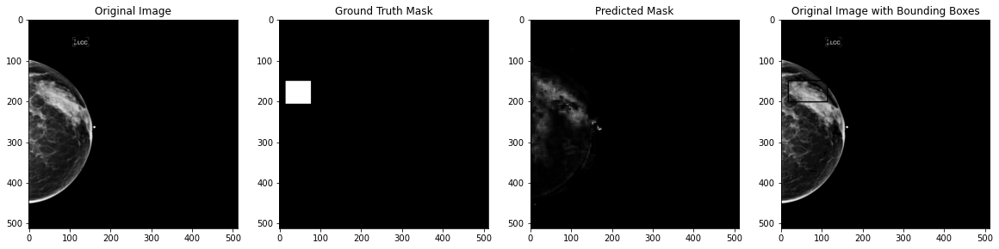


 55%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 551/1000 [03:32<02:35,  2.88it/s]

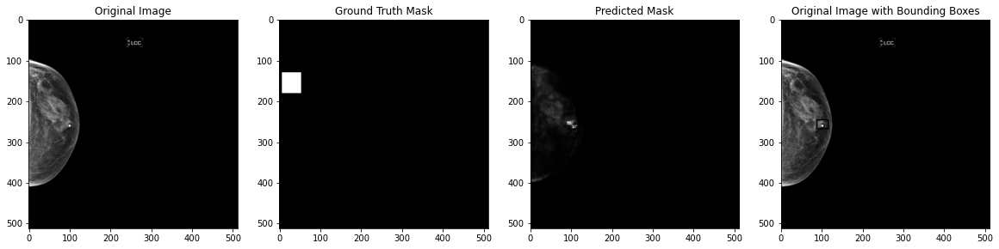


 56%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 556/1000 [03:34<02:34,  2.88it/s]

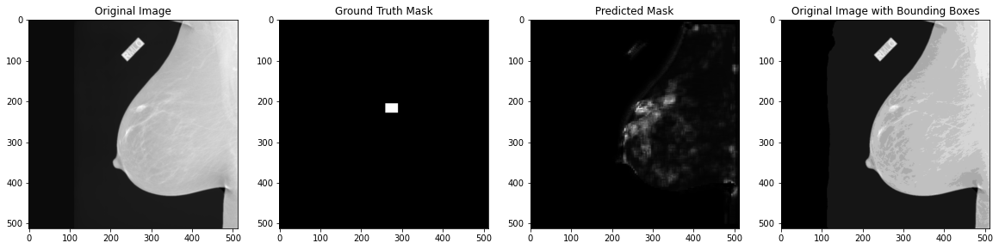


 56%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 561/1000 [03:36<02:30,  2.92it/s]

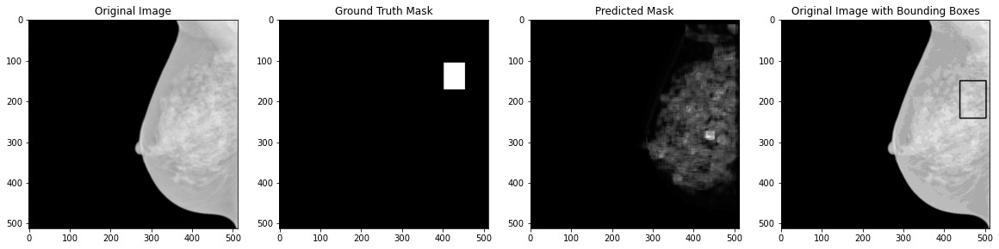


 57%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 566/1000 [03:38<02:30,  2.88it/s]

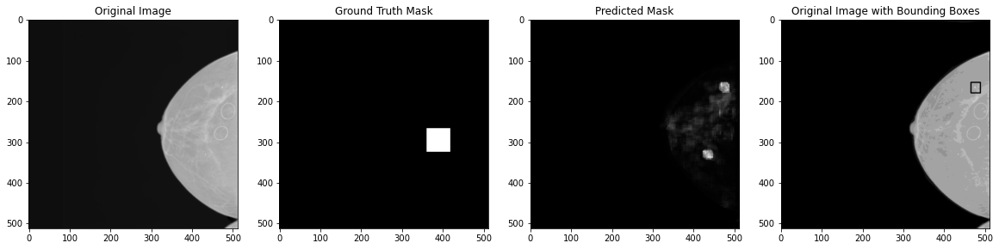


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:24<00:00,  2.54it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 571/1000 [03:39<02:29,  2.88it/s]

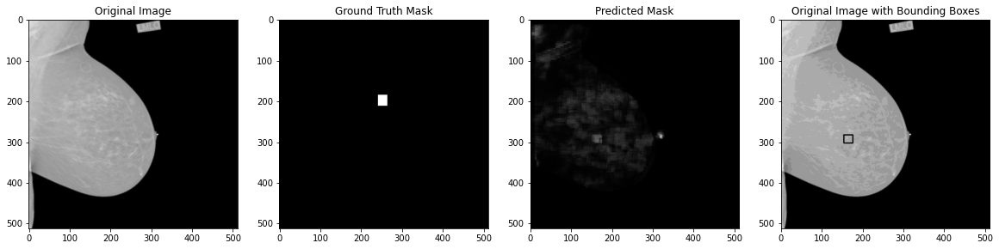


 58%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 576/1000 [03:41<02:24,  2.93it/s]

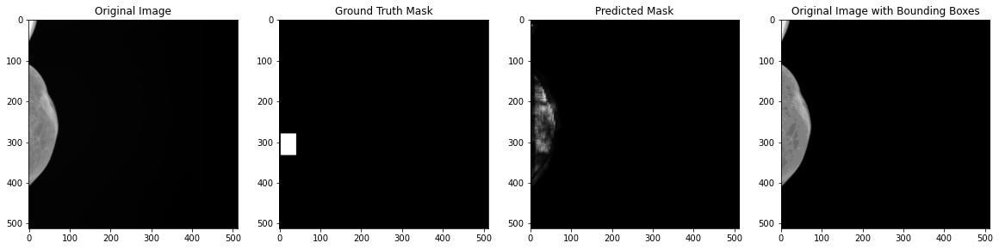


 58%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 581/1000 [03:43<02:22,  2.95it/s]

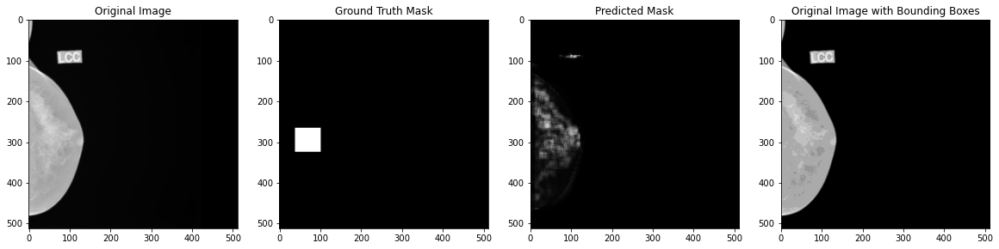


 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 586/1000 [03:45<02:23,  2.89it/s]

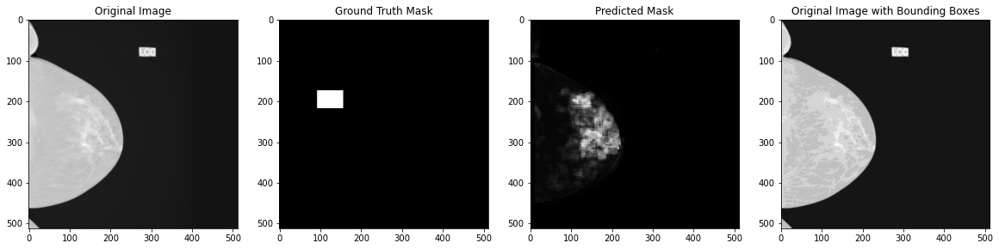


 59%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 591/1000 [03:47<02:18,  2.95it/s]

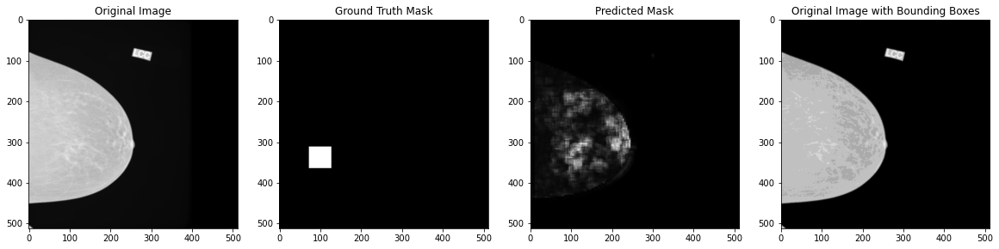


 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 596/1000 [03:49<02:18,  2.91it/s]

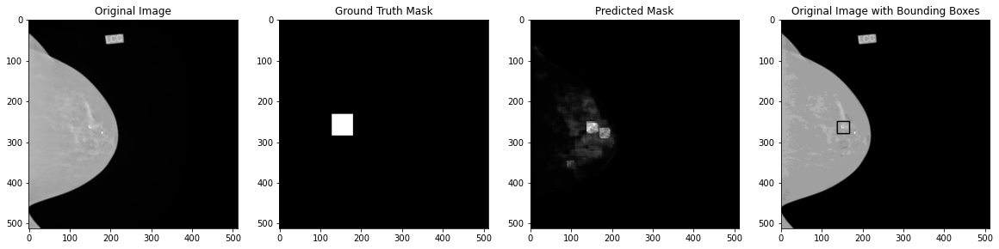


 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 601/1000 [03:51<02:18,  2.87it/s]

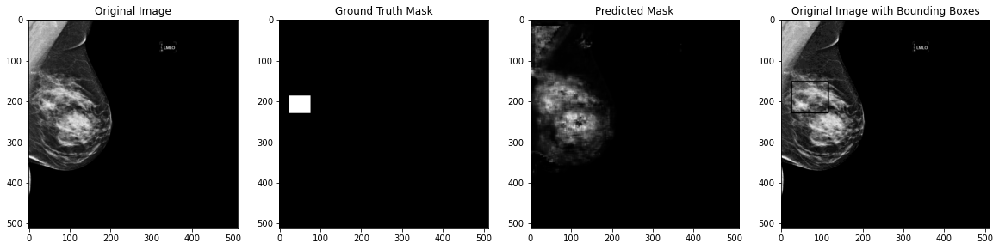


 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 606/1000 [03:53<02:13,  2.95it/s]

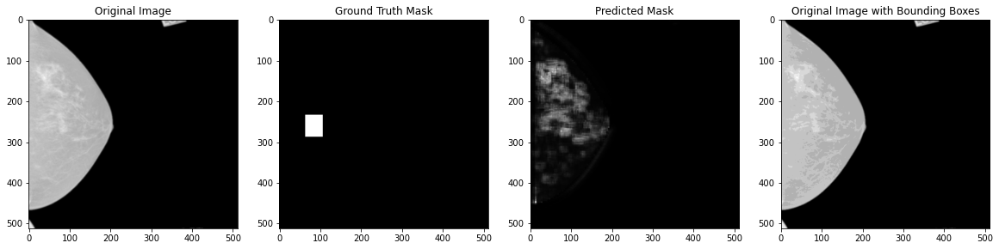


 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 611/1000 [03:55<02:37,  2.48it/s]

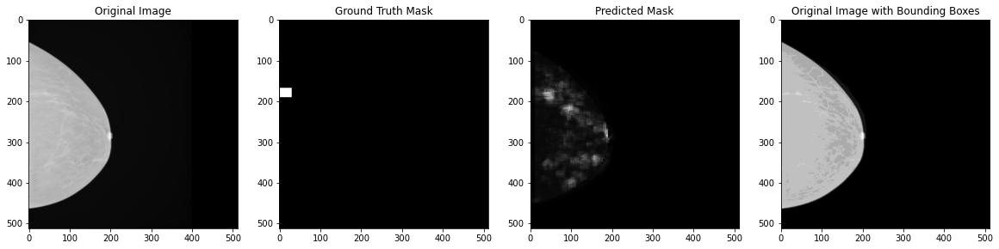


 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 616/1000 [03:57<02:16,  2.81it/s]

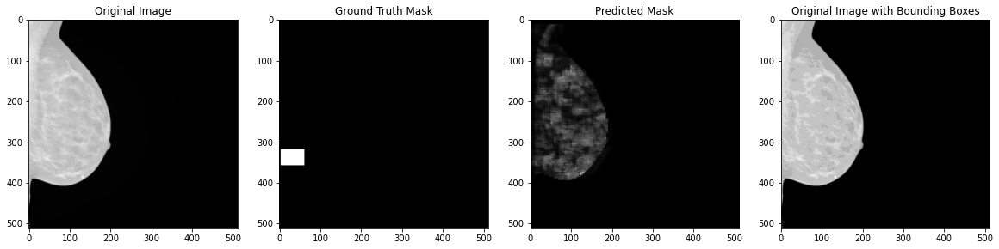


 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 621/1000 [03:59<02:11,  2.87it/s]

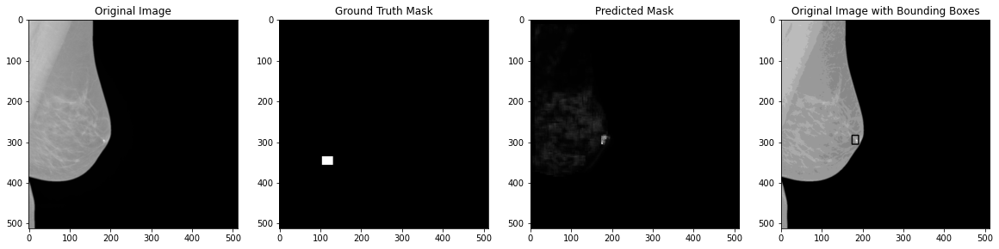


 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 626/1000 [04:01<02:08,  2.91it/s]

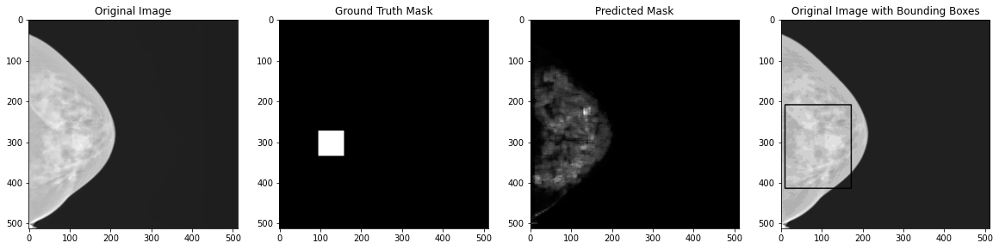


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:23<00:00,  2.64it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 631/1000 [04:02<01:53,  3.24it/s]

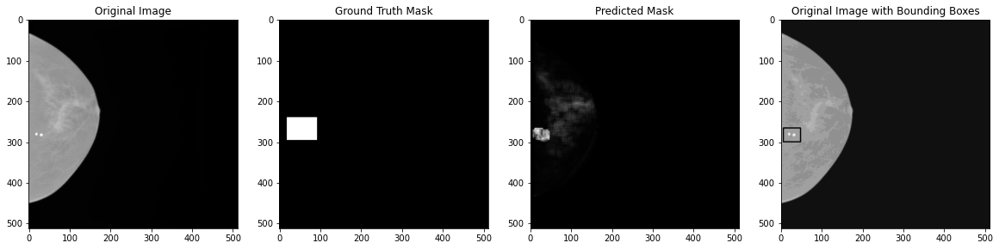


 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 636/1000 [04:04<02:06,  2.89it/s]

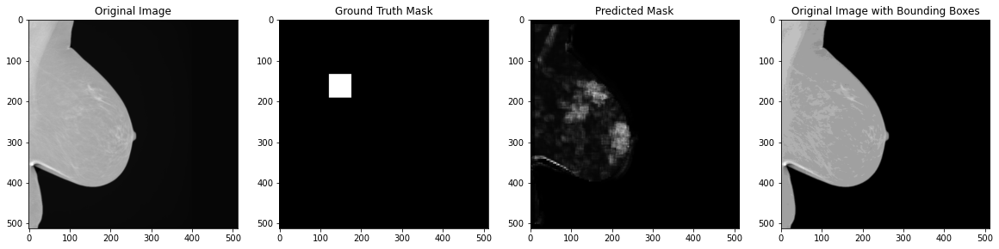


 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 641/1000 [04:06<02:01,  2.94it/s]

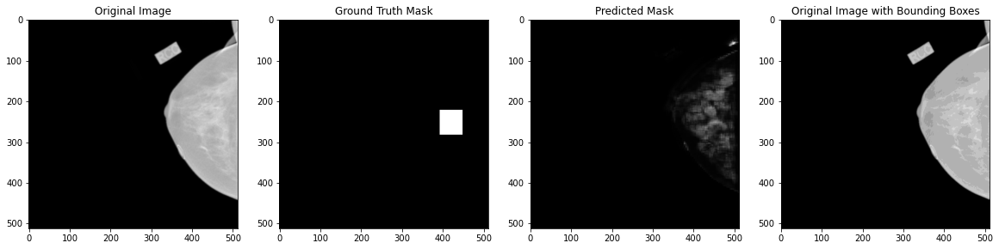


 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 646/1000 [04:08<02:03,  2.87it/s]

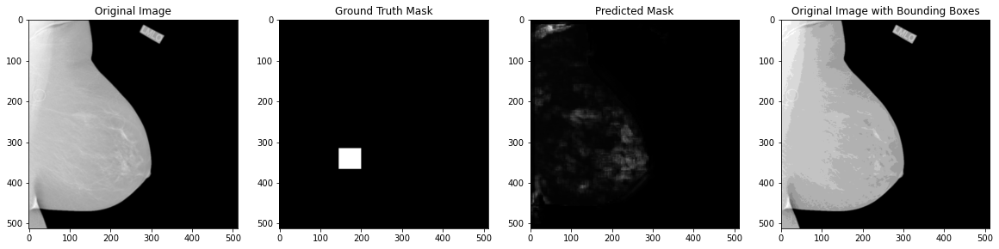


 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 651/1000 [04:10<02:02,  2.86it/s]

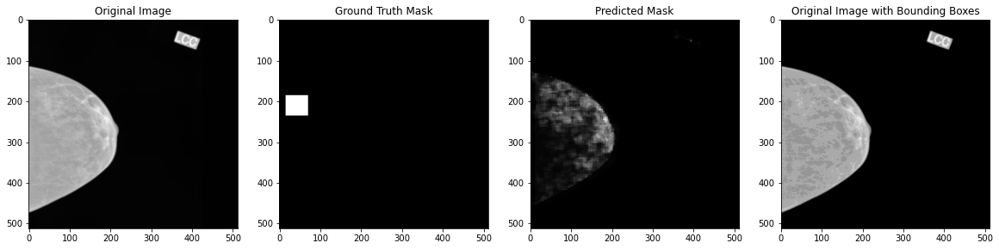


 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 656/1000 [04:12<01:58,  2.89it/s]

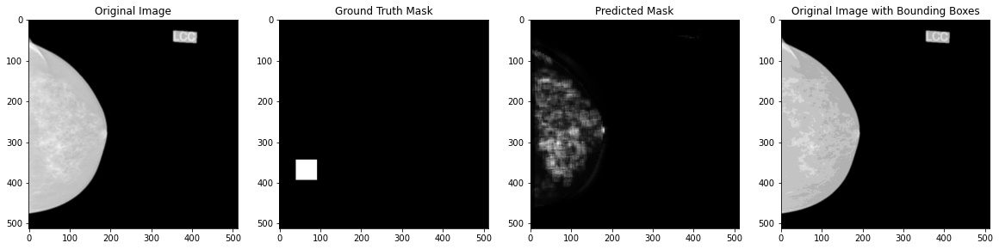


 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 661/1000 [04:14<01:57,  2.88it/s]

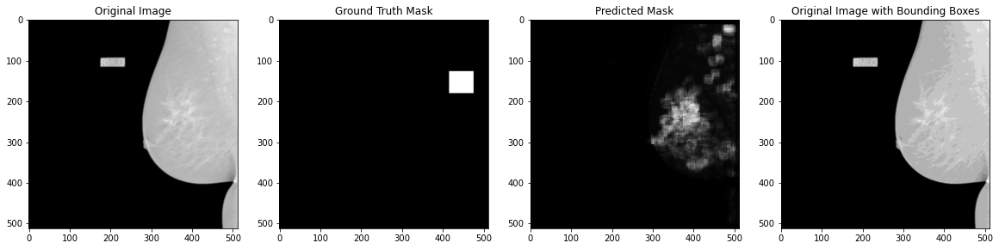


 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 666/1000 [04:16<01:54,  2.92it/s]

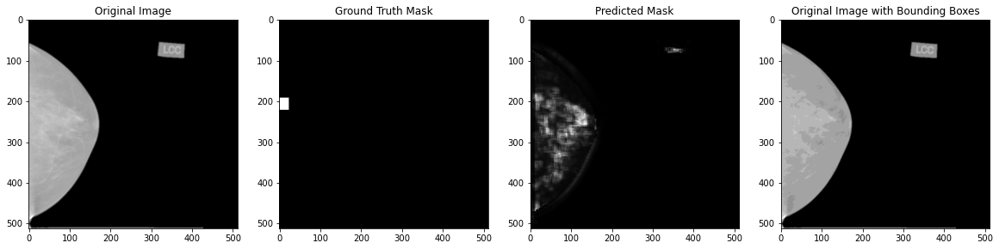


 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 671/1000 [04:18<01:53,  2.89it/s]

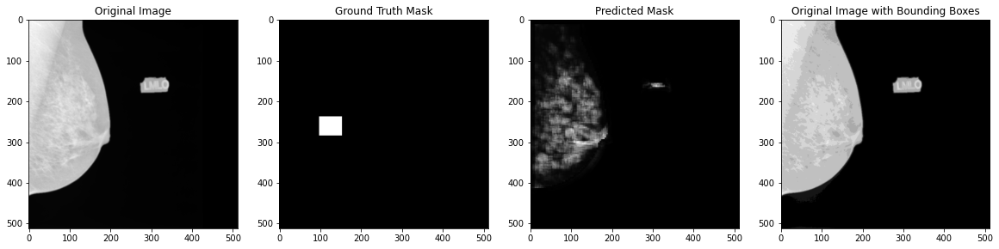


 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 676/1000 [04:20<01:52,  2.88it/s]

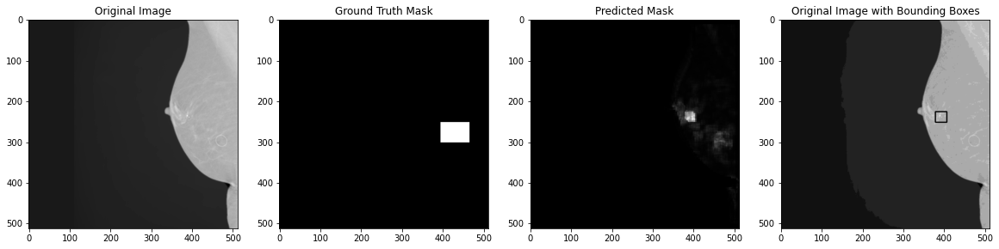


 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 681/1000 [04:22<01:54,  2.79it/s]

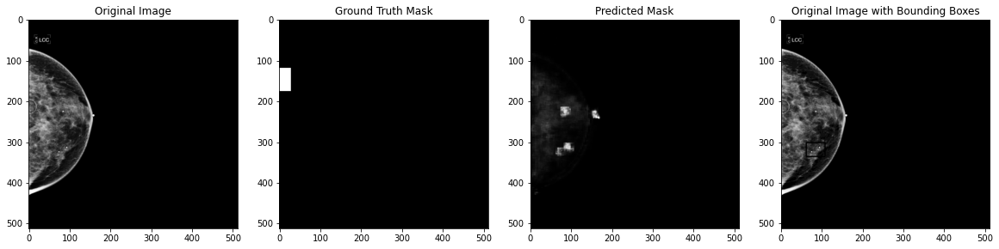


 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 686/1000 [04:24<01:49,  2.87it/s]

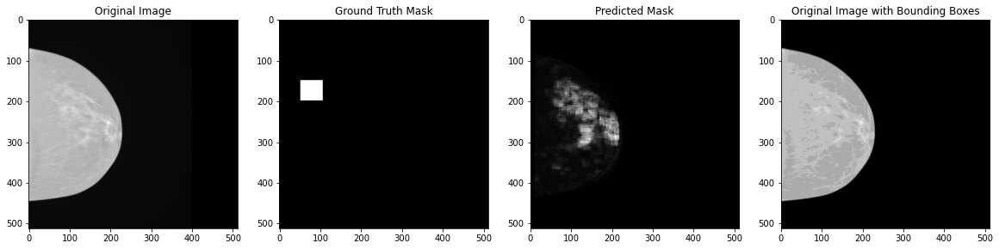


 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 691/1000 [04:26<01:45,  2.93it/s]

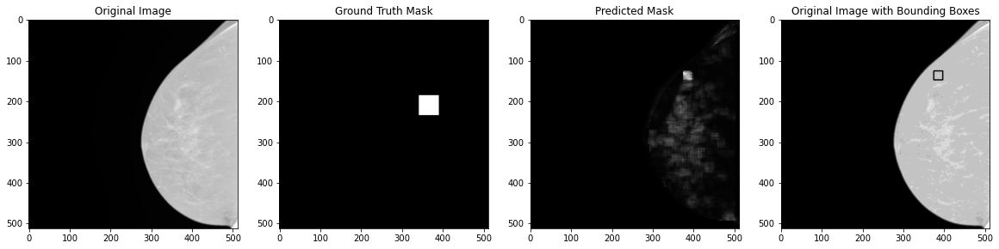


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:24<00:00,  2.58it/s]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 696/1000 [04:27<01:37,  3.13it/s]

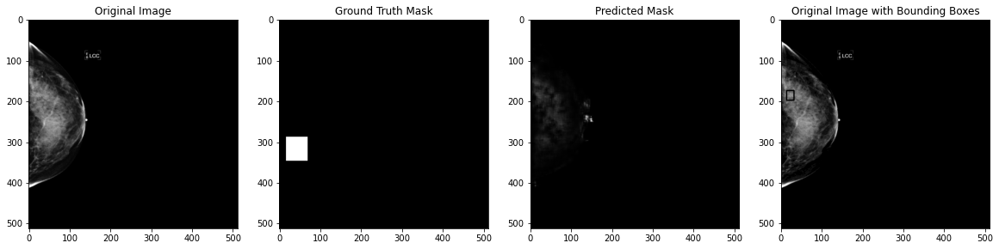


 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 701/1000 [04:29<01:39,  3.00it/s]

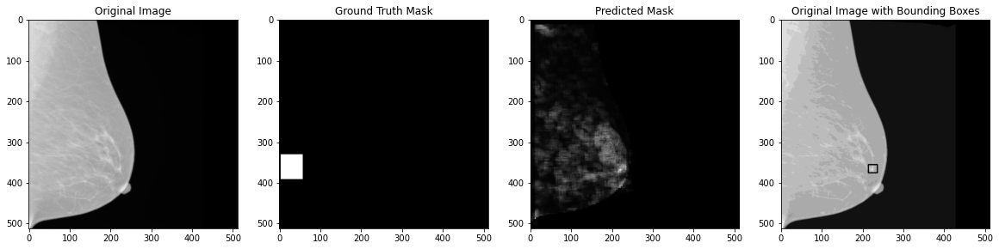


 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 706/1000 [04:31<01:41,  2.90it/s]

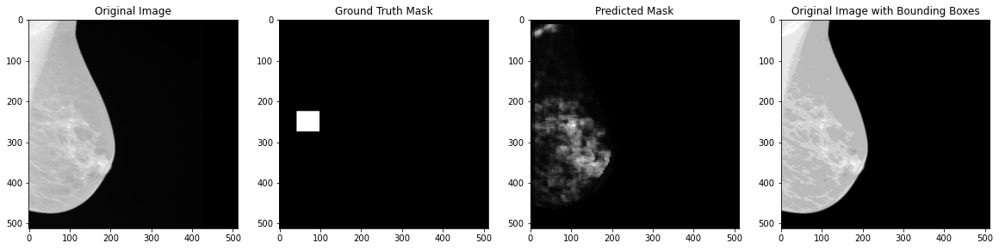


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 711/1000 [04:33<01:48,  2.67it/s]

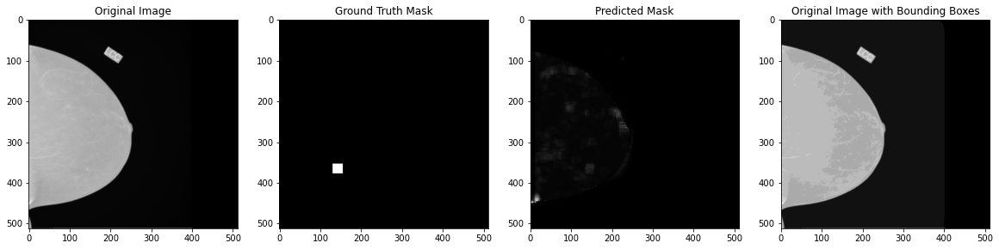


 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 716/1000 [04:35<01:39,  2.84it/s]

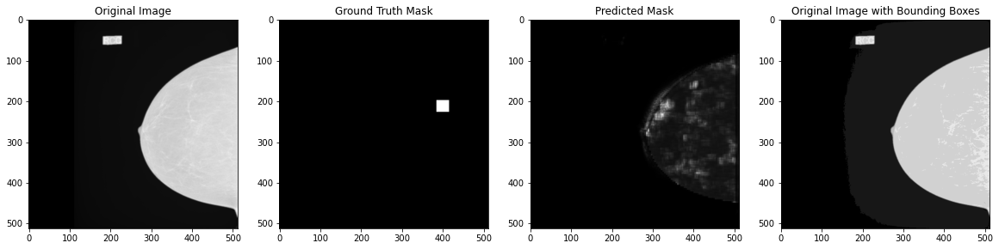


 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 721/1000 [04:37<01:43,  2.71it/s]

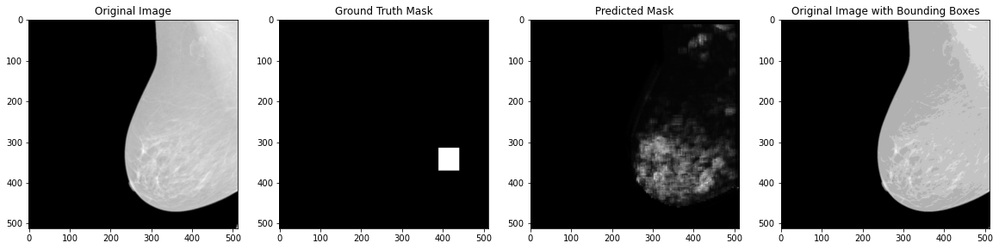


 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 726/1000 [04:39<01:33,  2.93it/s]

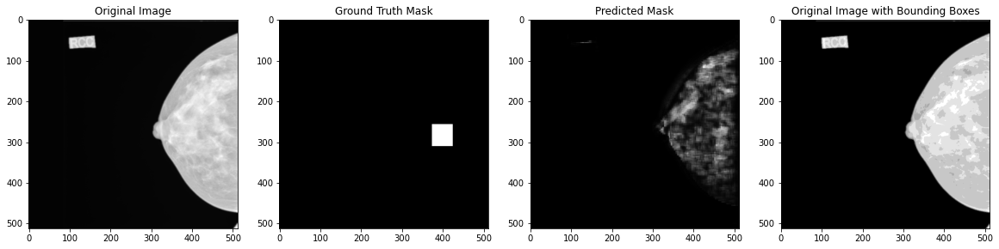


 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 731/1000 [04:41<01:32,  2.90it/s]

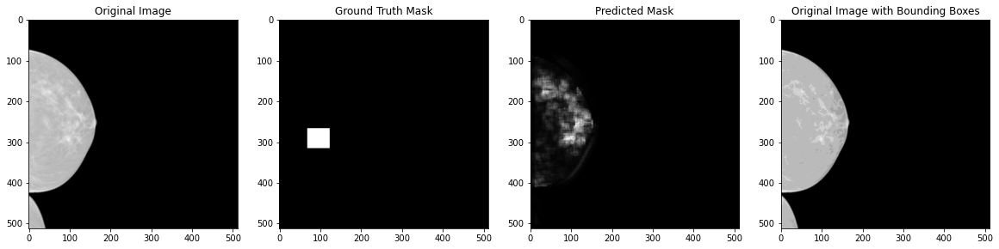


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 736/1000 [04:43<01:29,  2.95it/s]

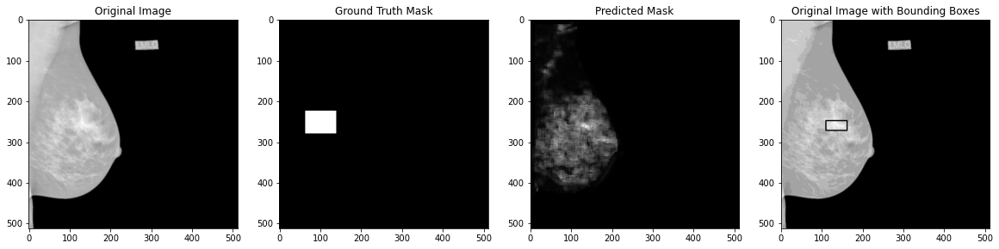


 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 741/1000 [04:45<01:31,  2.84it/s]

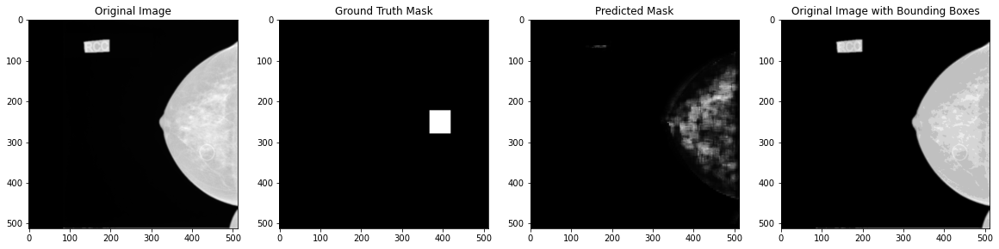


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 746/1000 [04:47<01:28,  2.86it/s]

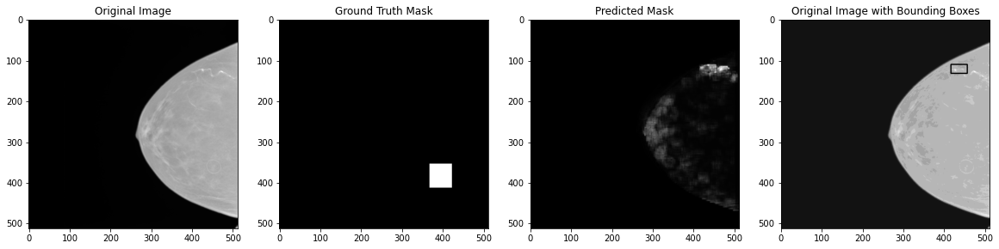


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 751/1000 [04:49<01:26,  2.87it/s]

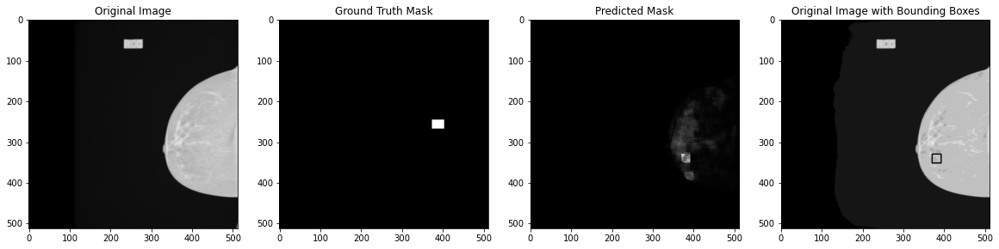


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 756/1000 [04:51<01:16,  3.20it/s]

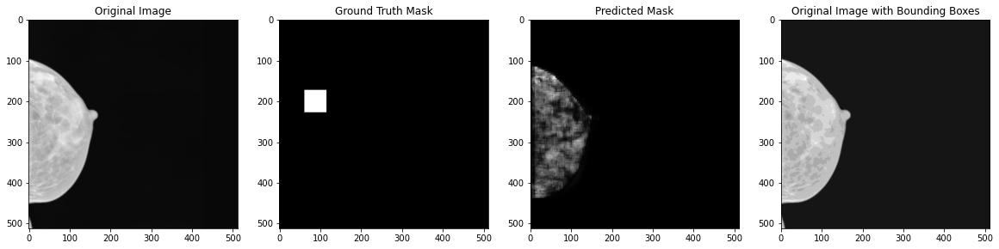


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:24<00:00,  2.57it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 761/1000 [04:53<01:22,  2.90it/s]

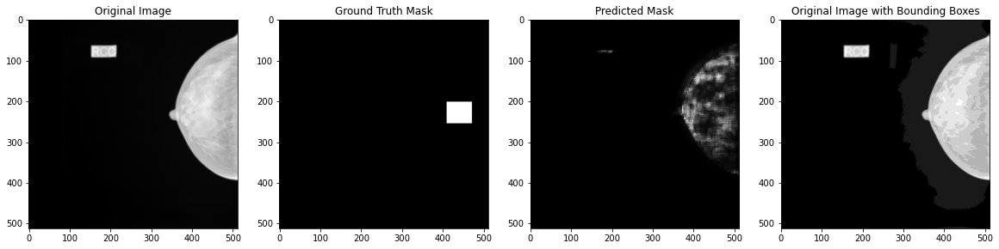


 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 766/1000 [04:55<01:22,  2.83it/s]

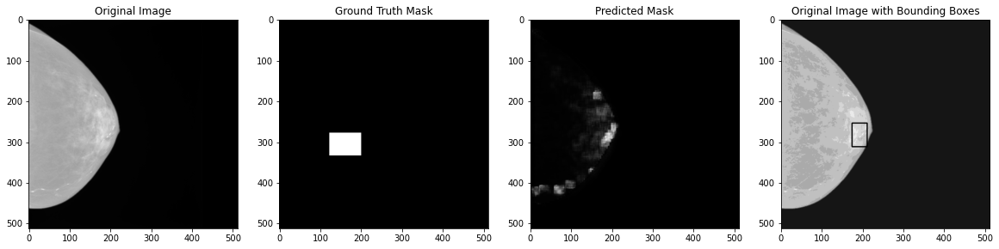


 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 771/1000 [04:57<01:21,  2.81it/s]

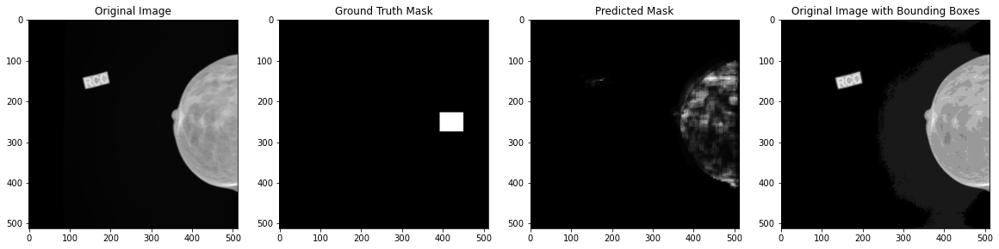


 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 776/1000 [04:58<01:15,  2.95it/s]

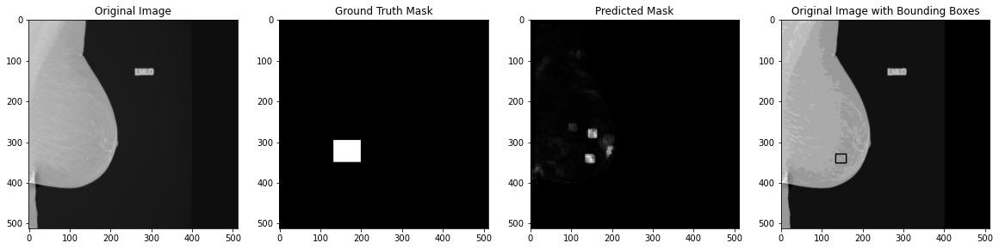


 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 781/1000 [05:00<01:14,  2.93it/s]

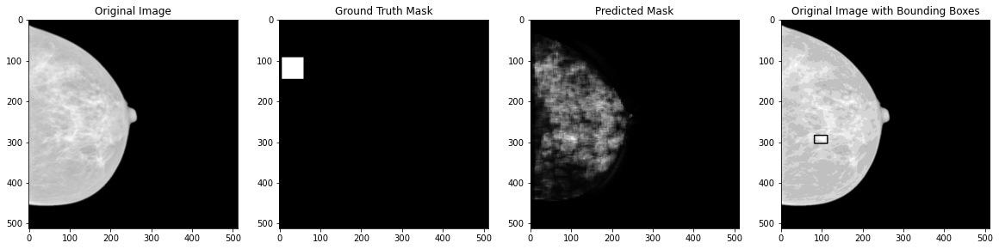


 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 786/1000 [05:02<01:14,  2.88it/s]

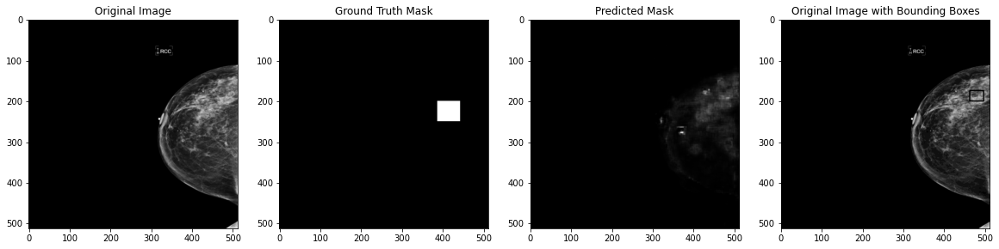


 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 791/1000 [05:04<01:10,  2.94it/s]

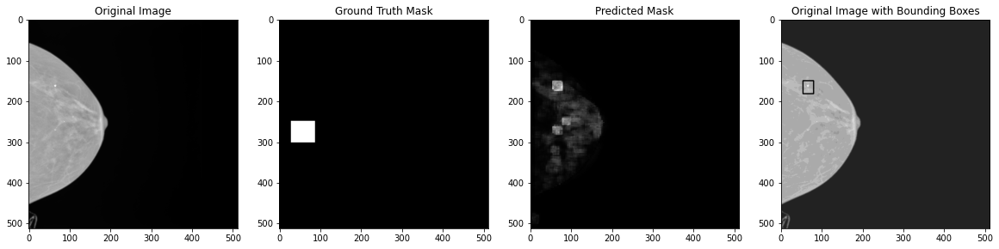


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 796/1000 [05:06<01:12,  2.81it/s]

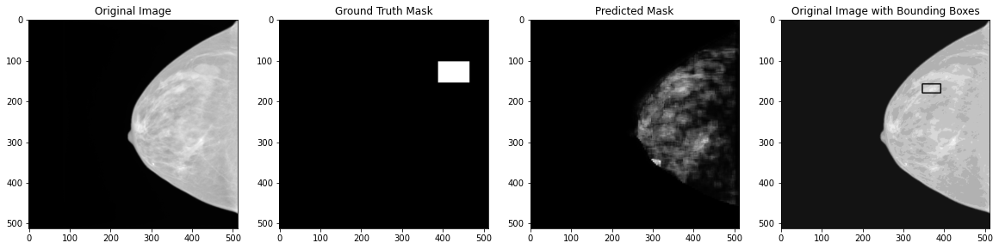


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 801/1000 [05:08<01:07,  2.93it/s]

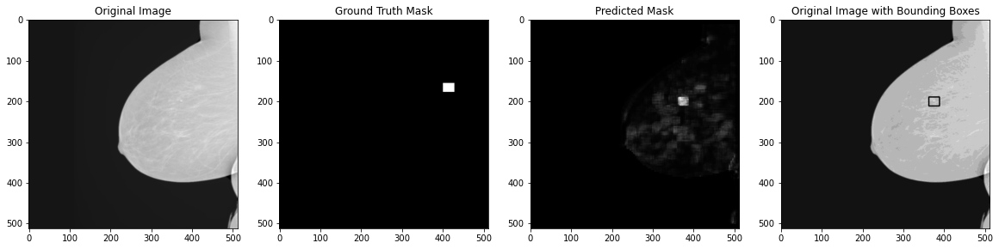


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 806/1000 [05:10<01:09,  2.80it/s]

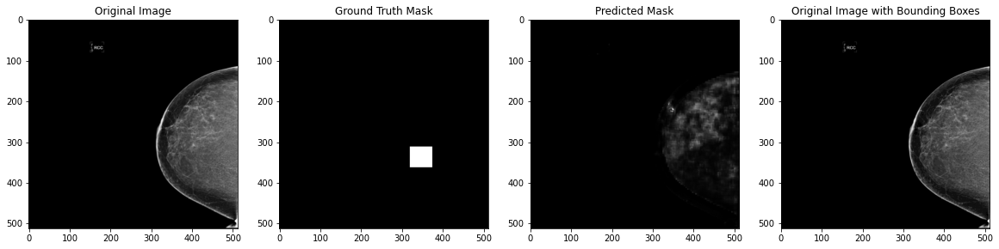


 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 811/1000 [05:12<01:10,  2.67it/s]

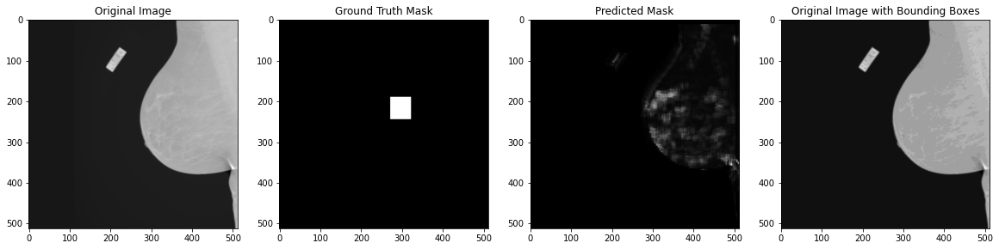


 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 816/1000 [05:14<01:04,  2.85it/s]

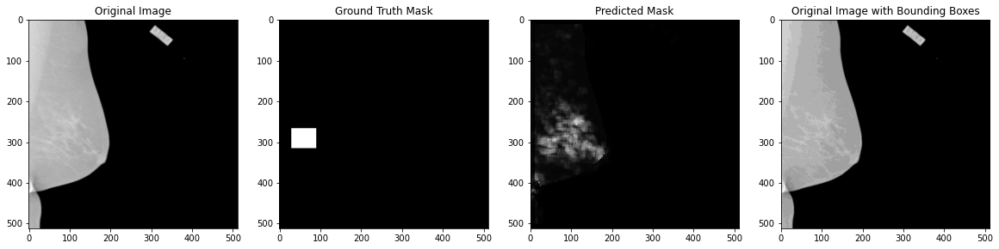


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:24<00:00,  2.62it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 821/1000 [05:16<00:56,  3.14it/s]

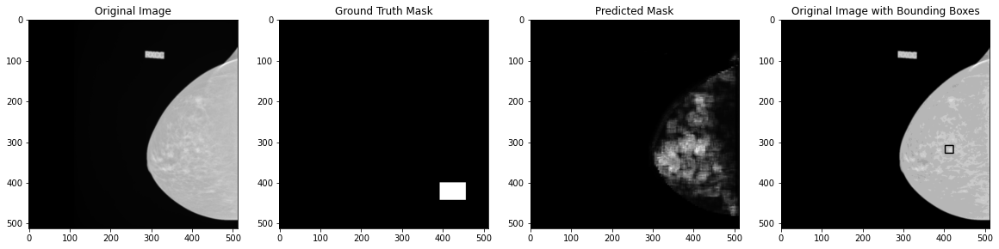


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 826/1000 [05:18<01:01,  2.85it/s]

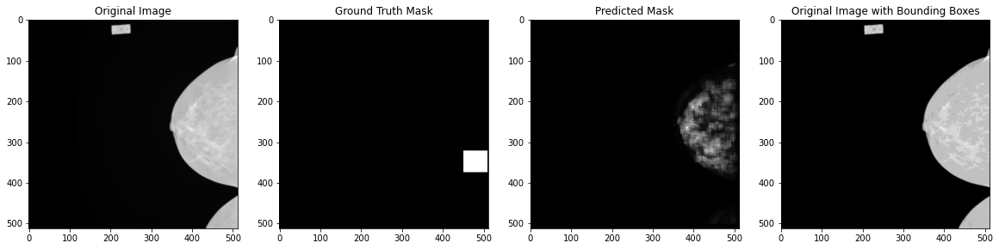


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 831/1000 [05:20<01:01,  2.77it/s]

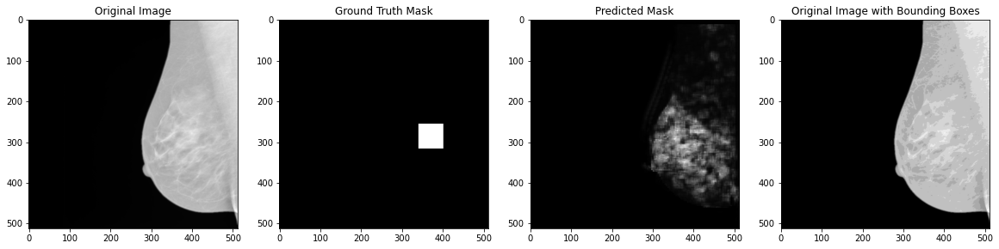


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 836/1000 [05:22<01:08,  2.39it/s]

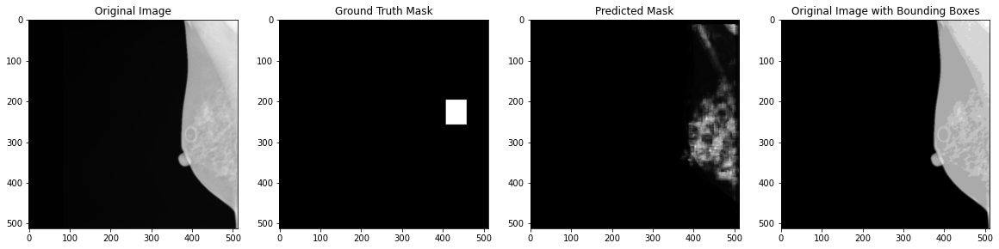


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 841/1000 [05:24<00:56,  2.83it/s]

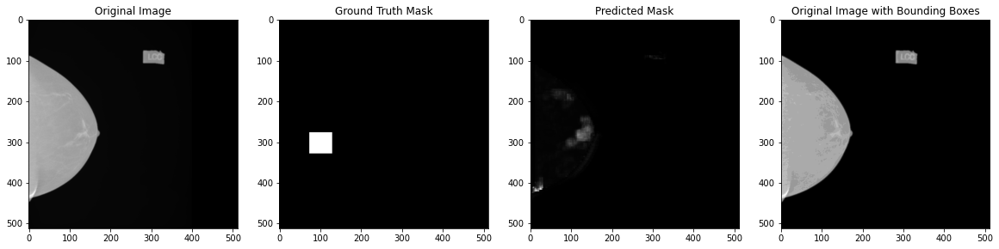


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 846/1000 [05:26<00:54,  2.85it/s]

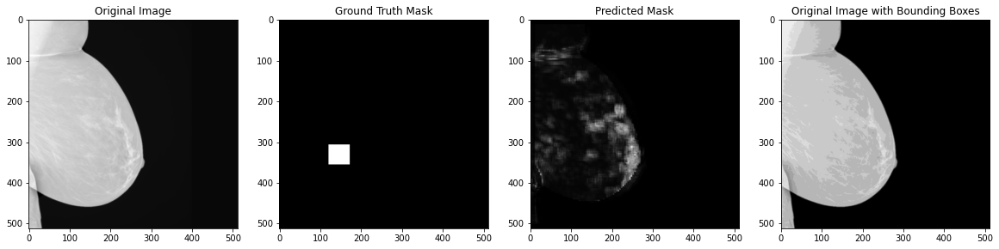


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 851/1000 [05:28<00:52,  2.86it/s]

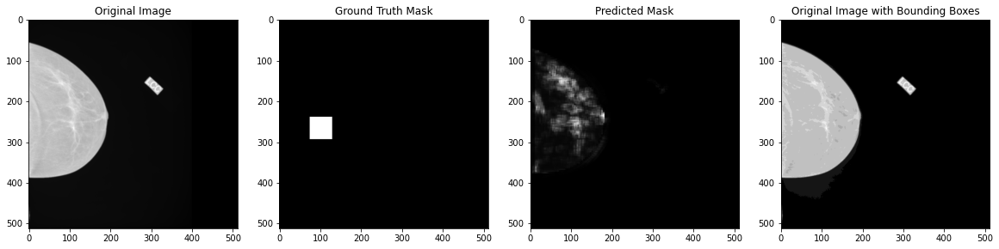


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 856/1000 [05:30<00:49,  2.90it/s]

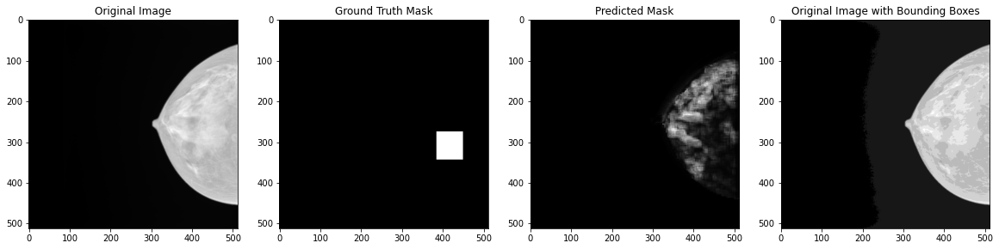


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 861/1000 [05:32<00:47,  2.94it/s]

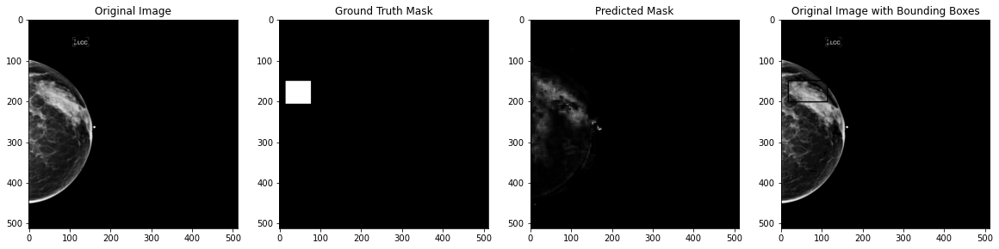


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 866/1000 [05:34<00:50,  2.65it/s]

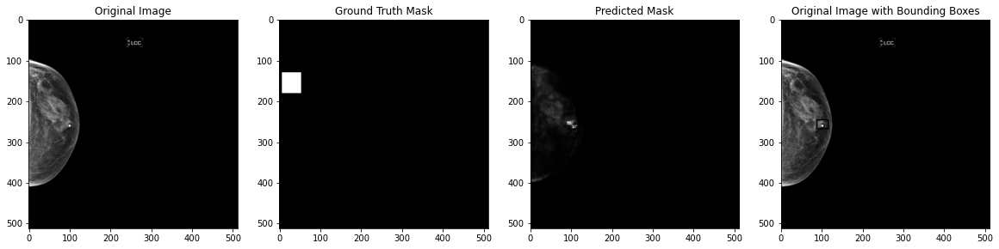


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 871/1000 [05:36<00:45,  2.86it/s]

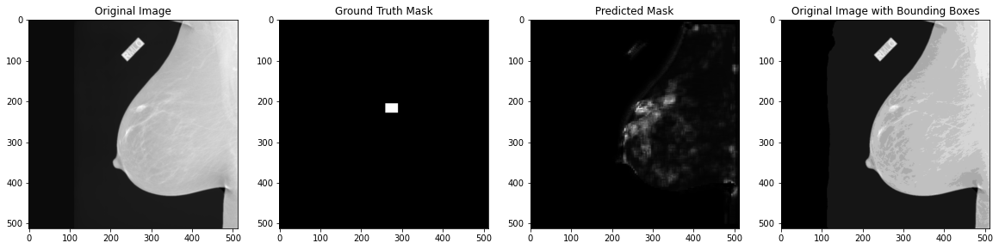


 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 876/1000 [05:38<00:43,  2.86it/s]

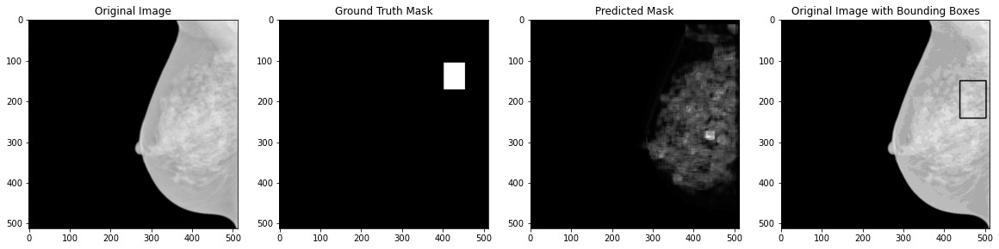


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 881/1000 [05:40<00:41,  2.86it/s]

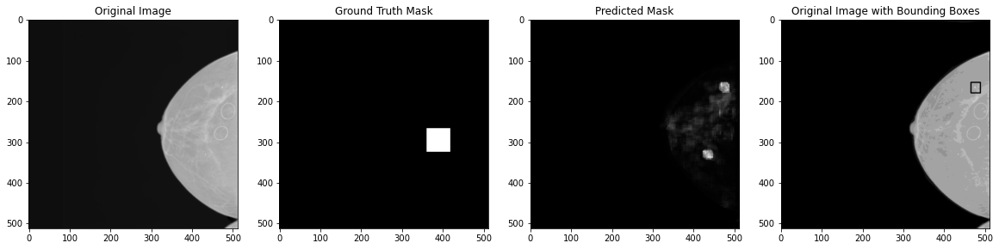


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:24<00:00,  2.53it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 886/1000 [05:41<00:39,  2.91it/s]

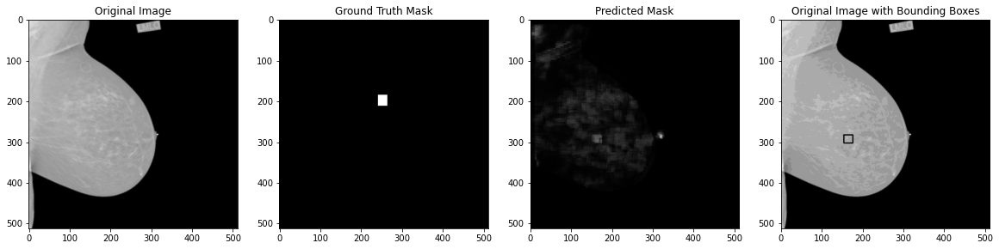


 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 891/1000 [05:43<00:36,  2.96it/s]

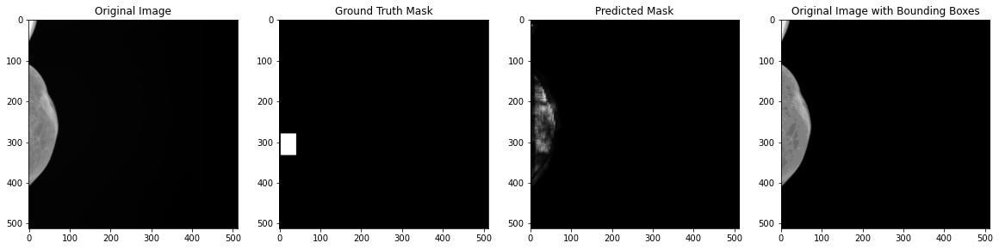


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 896/1000 [05:45<00:35,  2.93it/s]

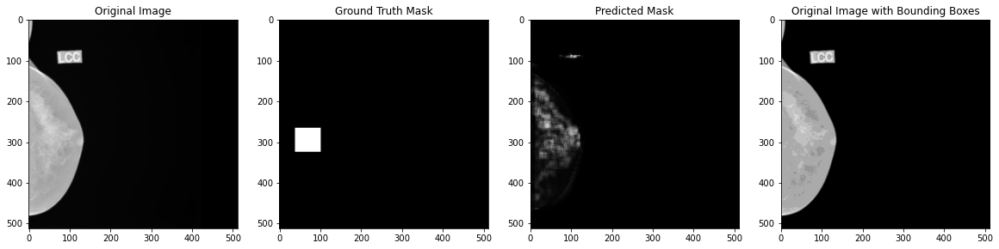


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 901/1000 [05:47<00:34,  2.88it/s]

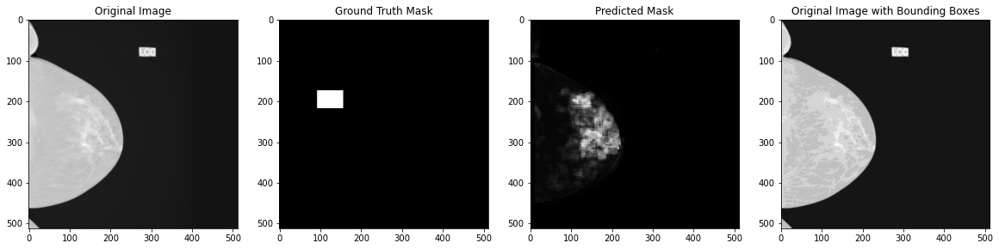


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 906/1000 [05:49<00:33,  2.80it/s]

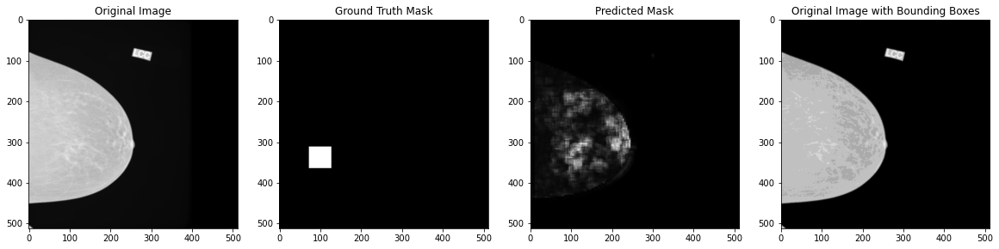


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 911/1000 [05:51<00:31,  2.85it/s]

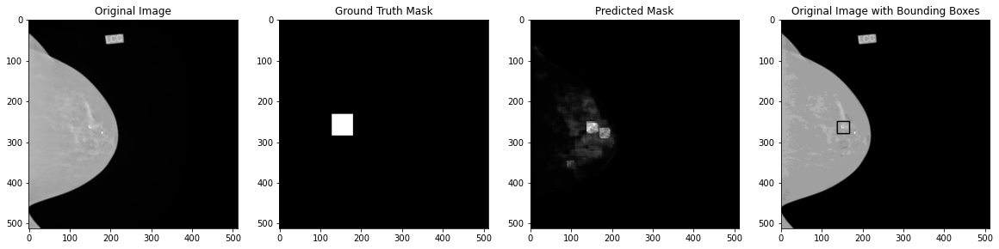


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 916/1000 [05:53<00:30,  2.76it/s]

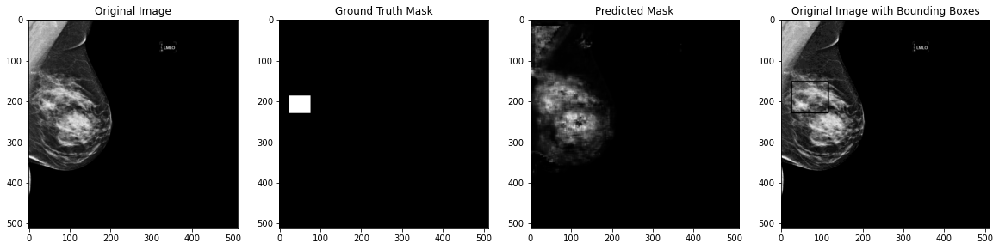


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 921/1000 [05:55<00:28,  2.78it/s]

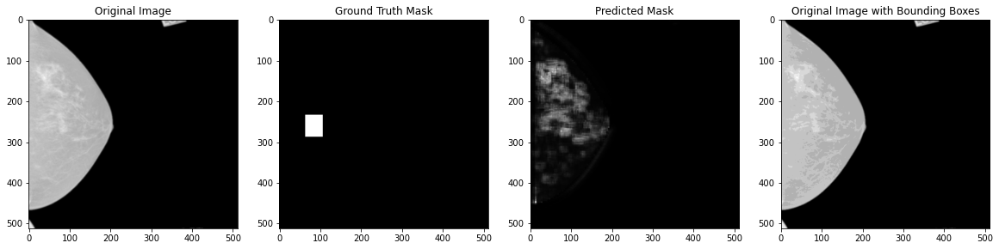


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 926/1000 [05:57<00:25,  2.94it/s]

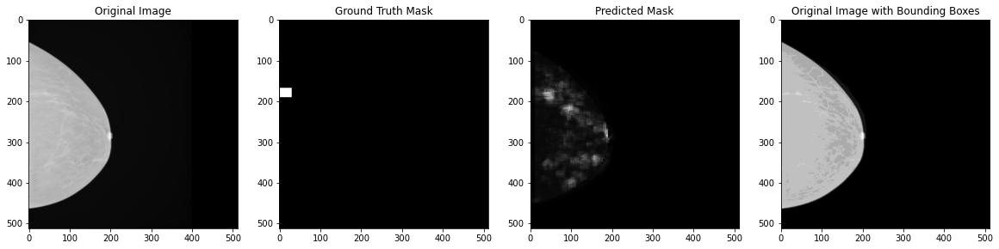


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 931/1000 [05:59<00:23,  2.89it/s]

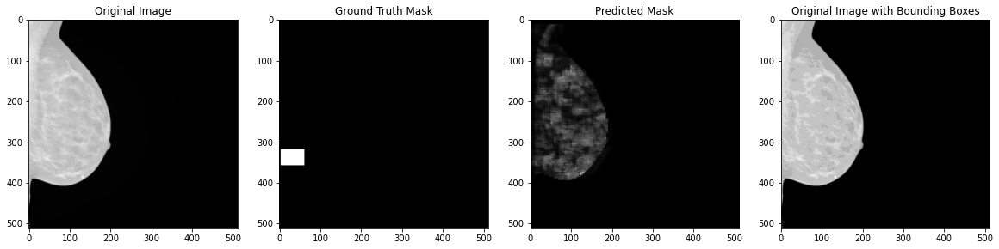


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 936/1000 [06:01<00:22,  2.89it/s]

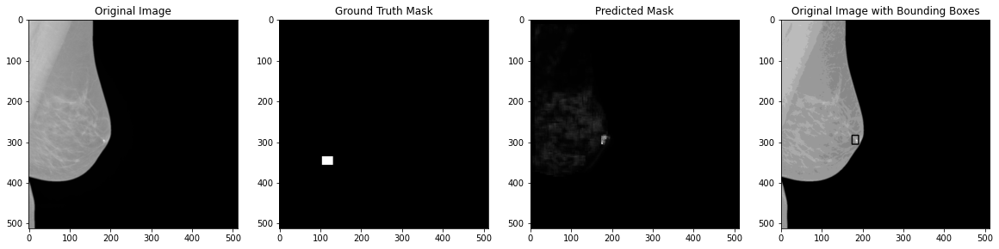


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 941/1000 [06:03<00:21,  2.81it/s]

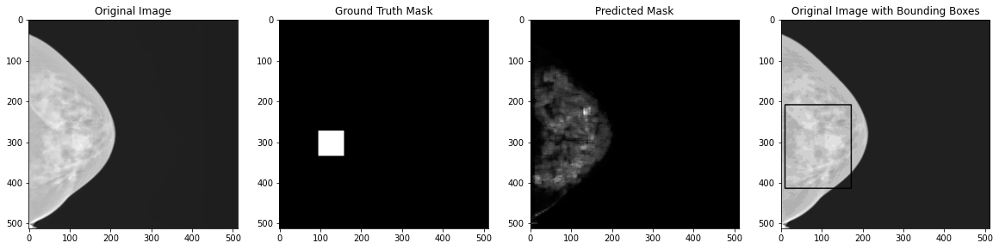


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:24<00:00,  2.58it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 946/1000 [06:05<00:17,  3.07it/s]

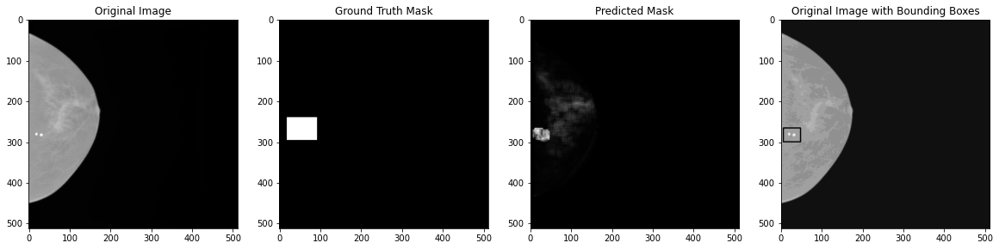


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 951/1000 [06:07<00:16,  2.90it/s]

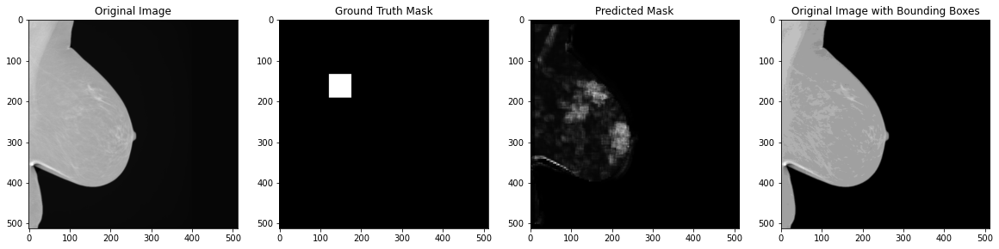


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 956/1000 [06:09<00:15,  2.86it/s]

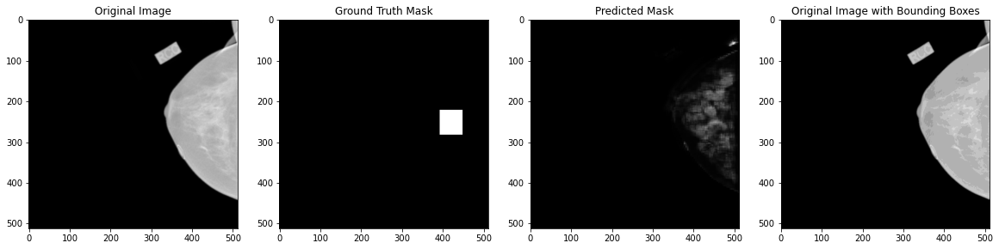


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 961/1000 [06:10<00:13,  2.82it/s]

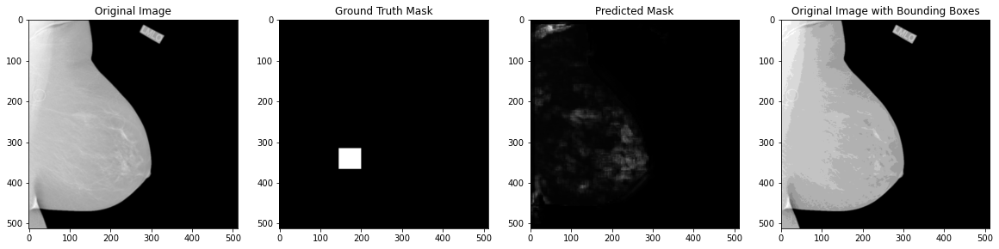


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 966/1000 [06:12<00:11,  2.94it/s]

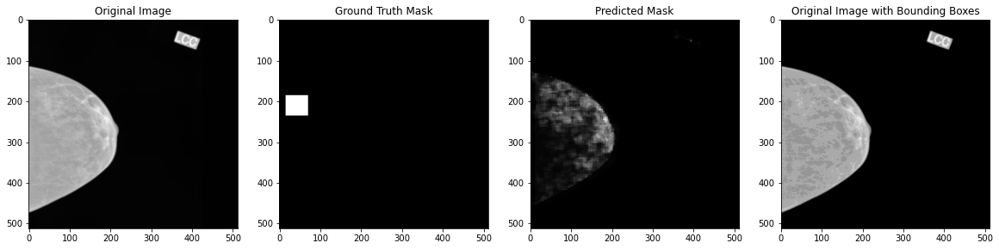


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 971/1000 [06:14<00:09,  2.95it/s]

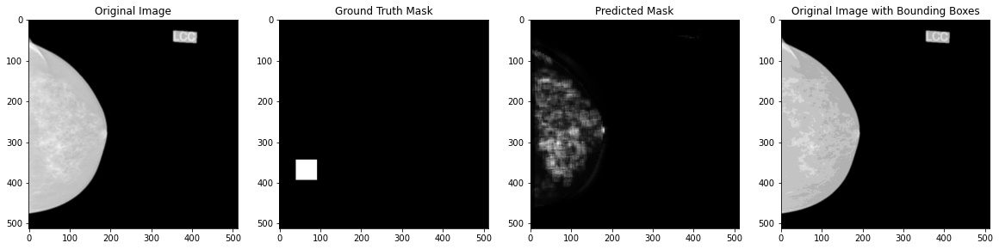


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 976/1000 [06:16<00:08,  2.88it/s]

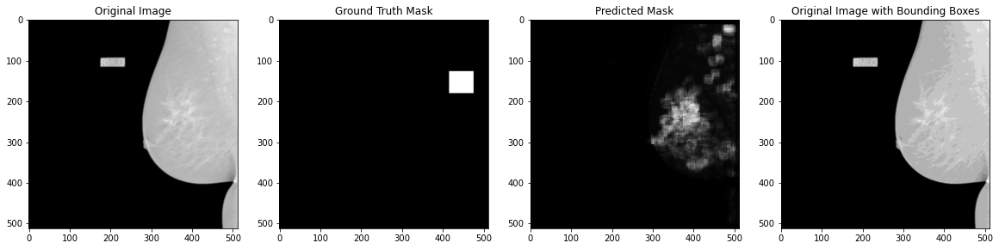


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 981/1000 [06:18<00:06,  2.81it/s]

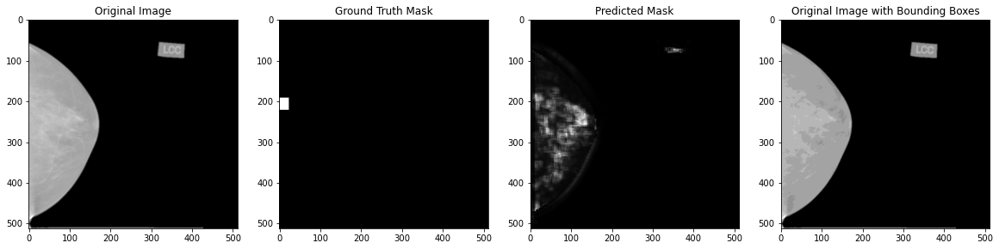


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 986/1000 [06:20<00:05,  2.80it/s]

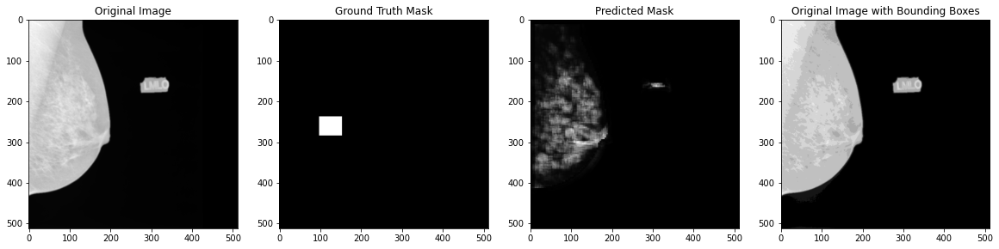


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 991/1000 [06:22<00:03,  2.88it/s]

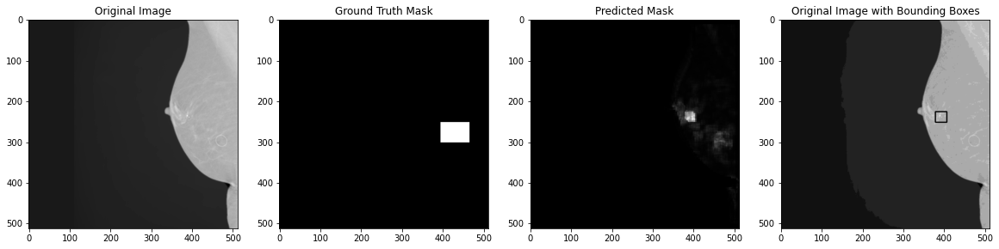


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 996/1000 [06:24<00:01,  2.95it/s]

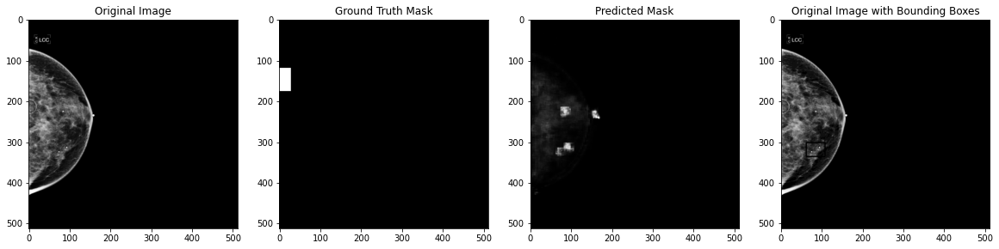


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [06:26<00:00,  2.59it/s]


In [42]:
# Initialize progress bar and storage list
all_predictions = []

test_steps = 1000  # or whatever number of steps you want to visualize

# Initialize the TQDM progress bar
with tqdm(total=test_steps, dynamic_ncols=True) as pbar:
    for i in range(test_steps):
        batch_data, ground_truth_masks = next(test_generator)

        # Make predictions
        predicted_masks = model.predict(batch_data, verbose=0)

        # Convert prediction to uint8 and threshold
        mask_uint8 = (np.squeeze(predicted_masks[0]) * 255).astype(np.uint8)

        # Append predictions to all_predictions list
        all_predictions.append(predicted_masks)

        # Update progress bar
        pbar.update(1)

        # For demonstration, let's visualize the first image in the batch
        if i % 5 == 0:  # Adjust this frequency as needed
            plt.figure(figsize=(20, 5))

            # Plot original image
            plt.subplot(1, 4, 1)
            plt.title('Original Image')
            plt.imshow(np.squeeze(batch_data[0]), cmap='gray')

            # Plot ground truth mask
            plt.subplot(1, 4, 2)
            plt.title('Ground Truth Mask')
            plt.imshow(np.squeeze(ground_truth_masks[0]), cmap='gray')

            # Plot predicted mask
            plt.subplot(1, 4, 3)
            plt.title('Predicted Mask')
            plt.imshow(np.squeeze(predicted_masks[0]), cmap='gray')

            # Draw bounding boxes on the original image using the predicted mask
            original_image_with_boxes = get_and_draw_bounding_boxes(mask_uint8, np.squeeze(batch_data[0]).astype(np.uint8))

            # Plot original image with bounding boxes
            plt.subplot(1, 4, 4)
            plt.title('Original Image with Bounding Boxes')
            plt.imshow(original_image_with_boxes, cmap='gray')

            plt.show()

In [ ]:
# from matplotlib import pyplot as plt
# import numpy as np

# # Initialize progress bar and storage list
# all_predictions = []

# test_steps = 1000


# with tqdm(total=test_steps, dynamic_ncols=True) as pbar:
#     for i in range(test_steps):
#         batch_data, ground_truth_masks = next(test_generator)
        
#         # Make predictions
#         predicted_masks = model.predict(batch_data, verbose=0)
        
#         # Append predictions to all_predictions list
#         all_predictions.append(predicted_masks)
        
#         # Update progress bar
#         pbar.update(1)
        
#         # For demonstration, let's visualize the first image in the batch
#         if i % 5 == 0:  # Adjust this frequency as needed
#             plt.figure(figsize=(15, 5))
            
#             # Plot original image
#             plt.subplot(1, 3, 1)
#             plt.title('Original Image')
#             plt.imshow(np.squeeze(batch_data[0]), cmap='gray')
            
#             # Plot ground truth mask
#             plt.subplot(1, 3, 2)
#             plt.title('Ground Truth Mask')
#             plt.imshow(np.squeeze(ground_truth_masks[0]), cmap='gray')
            
#             # Plot predicted mask
#             plt.subplot(1, 3, 3)
#             plt.title('Predicted Mask')
#             plt.imshow(np.squeeze(predicted_masks[0]), cmap='gray')
            
#             plt.show()
